This is the notebook meant for the detailed analysis of time crystals. It might be easier for development of actual code. 

# Imports and Funtions 

## Imports

In [14]:
import astropy.io.fits as pyfits
import numpy as np
import matplotlib.pyplot as plt
import os
import matplotlib
from matplotlib.widgets import Slider
from matplotlib import colors
from matplotlib.gridspec import GridSpec
from IPython.display import clear_output
import scipy.odr as odr
import imageio
import gc
from matplotlib.widgets import EllipseSelector, RectangleSelector
from matplotlib.pyplot import cm
from scipy.special import eval_legendre
from scipy.optimize import curve_fit
import scipy.fftpack as fft
from matplotlib.colors import LogNorm
import csv

import time
import sys
import argparse
import glob
import csv

from OAH_refocus import *
from OAHDEV_functions import *

## Functions 

In [10]:
def L(z, j):
    """ Difference between the j+2'th and the j'th Legendre polynomials. """
    legendre_sum = eval_legendre(j+2, z) - eval_legendre(j, z)
    legendre_sum *= np.piecewise(z, [abs(z) <=1, abs(z) > 1], [1, 0])
    return legendre_sum

def TF_1D(x, amp, mid, r):
    """ A 1D Thomas Fermi function, a function of amplitude, radia and means. """
    value = 1 - ((x - mid) / r) ** 2
    value[value < 0] = 0
    profile = (np.abs(amp) * np.power(value, 3. / 2.)) 
    return profile
               
def TF_2D(x, amp, r, mid):
    """ A 2D Thomas Fermi function, a function of amplitude, radia and means (both x and y). """
    value = 1 - ((x[0] - mid[0]) / r[0]) ** 2 - ((x[1] - mid[1]) / r[1]) ** 2
    value[value < 0] = 0
    return np.abs(amp) * np.power(value, 3. / 2.)


def TFAX_1D(x, amp, mid, r, axamp, j, a, b):
    """ A 1D Thomas Fermi Axial function, a function of amplitude, radia and means (both x and y). """

    value = 1 - ((x - mid) / r) ** 2
    value[value < 0] = 0
    profile = np.abs(amp) * np.power(value, 3. / 2.)  + axamp * L((b * x + a -mid)/r, int(j))
    return profile


def TFAX_1D_mod1(x, amp, mid, r, axamp, j):
    """ Axial profile, for OAH imaging, version two. """
    value = 1 - ((x - mid) / r) ** 2
    value[value < 0] = 0
    profile = (np.abs(amp) * np.power(value, 3. / 2.) + axamp * L((x-mid)/r, int(j))) * np.abs(amp) * np.power(value, 3. / 2.)
    return profile


def TFAX_1D_mod2(x, amp, mid, r, axamp, j):
    """ Squared axial profile, for OAH imaging. """
    value = 1 - ((x - mid) / r) ** 2
    value[value < 0] = 0
    profile = (np.abs(amp) * np.power(value, 3. / 2.) + axamp * L((x-mid)/r, int(j)))**2
    return profile

def TFAX_2D(x, amp, r, mid, j, axamp, b, c):
    """ 
        A 2D Thomas Fermi function, a function of amplitude, radia and means (both x and y). 
        Uf what, this function for some reason seems pretty good. It seems to match Jasper's figure 6.2 
        (from his PhD thesis), with the 
    """
    value = 1 - ((x[0] - mid[0]) / r[0]) ** 2 - ((x[1] - mid[1]) / r[1]) ** 2
    value[value < 0] = 0
    return (np.abs(amp) * np.power(value, 3. / 2.) + axamp*L((b*(x[0]-mid[0])+c)/r[0], j)) * np.abs(amp) * np.power(value, 3. / 2.) 

# Sinusoidal Fitting Functions
def func_damp_lin(x, a, b, c, d, lam, sl):
    """ 
        a = amplitude
        b = frequency
        c = phase shift
        d = y displacement
        lam = damping parameter
        sl = decline/slope parameter
    """
    return a * np.sin(2*np.pi*b*(x + c)) * np.exp(-lam*x) + (-sl*x) + d

# Other useful functions
def str_with_err(value, error):
    digits = -int(math.floor(math.log10(error)))
    return "{0:.{2}f}({1:.0f})".format(value, error*10**digits, digits)


if False: # ifyou want to check the models - go True
    # Plot vars
    amp = 0.75
    mid = 150
    mid_z = 150
    r = 125
    r_z = 125
    axamp = 1
    j = 50
    scale = 1
    shift = 0
    
    x = np.linspace(0, 300, 1001)
    z = np.linspace(0, 300, 1001)
    X, Z = np.meshgrid(x, z)
    pic2D = TFAX_2D((X, Z), 1, (r, r_z), (mid, mid_z), j, axamp, scale, shift)

    fig, ax = plt.subplots(5, 1, figsize=(9,9))
    ax[0].plot(x, TFAX_1D(x, amp, mid, r, axamp, j, shift, scale), alpha=0.2, label="TF+Ax")
    ax[1].plot(x, TFAX_1D_mod1(x, amp, mid, r, axamp, j), alpha=0.2, label="(TF+Ax)*TF")
    ax[2].plot(x, TFAX_1D_mod2(x, amp, mid, r, axamp, j), alpha=0.2, label="(TF+Ax)$^2$")
    im = ax[3].imshow(pic2D, vmin=-0.5, vmax=1.25, extent=[0, 300, 0, 300], aspect='auto', origin='lower', cmap='afmhot_r', interpolation='none')
    ax[4].plot(x, pic2D[500], alpha=0.2, label="Linecut of 2D plot")
    ax[4].plot(x, TFAX_1D_mod1(x, amp, mid, r, axamp, j), alpha=0.2, label="(TF+Ax)*TF")

    for a in ax:
        if a != ax[3]:
            a.plot(x, TF_1D(x, amp, mid, r), alpha=0.2, label="TF", c='orange')
            a.scatter(np.linspace(0, len(intg_ang), len(intg_ang)), intg_ang, c='k', alpha=0.05, s=4, label="data")
            a.legend()
    
    plt.show()
    

1.0

# Time Crystals Analysis

Now finally, let's write a script for the analysis of the time crystals. At least to check whether we have them. Then, we'll want to automize this in the python script to call from BECViewer.

## INIT

In [163]:
####################################################
## INITIALIZE 
####################################################
# Initialize the date, shot, num, quad and multi_loop
date = 20221110
shot = 26
num = 9
dz_focus = -0.0014
quad_cut = "quad2"
cut = [90, -5, 750, 1250]
multi_loop = 0

date = 20230413
shot = 158
num = 26
dz_focus = -0.000
quad_cut = "quad2"
cut = [90, -5, 750, 1250]
multi_loop = 0

In [164]:
# Initial values - guess
ang = 0 
center = (47, 156)
tfa, tfw = 1, (10, 150)
ga, gw = 1, (30, 20)
j_guess = 53
axamp = 1
x_shift = 0
squeeze_par = 1
# par_names = ['offset', 'ampl', 'ang', 'xmid', 'ymid', 'tfamp', 'tfxw', 'tfyw', 'gamp', 'gxw', 'gyw']
# par_names_timecrystal = ['offset', 'ampl', 'ang', 'xmid', 'ymid', 'tfamp', 'tfxw', 'tfyw', 'j', 'j_amp', 'x_shift', 'squeeze_par']

## Single Shot TF + Axial 

<IPython.core.display.Javascript object>


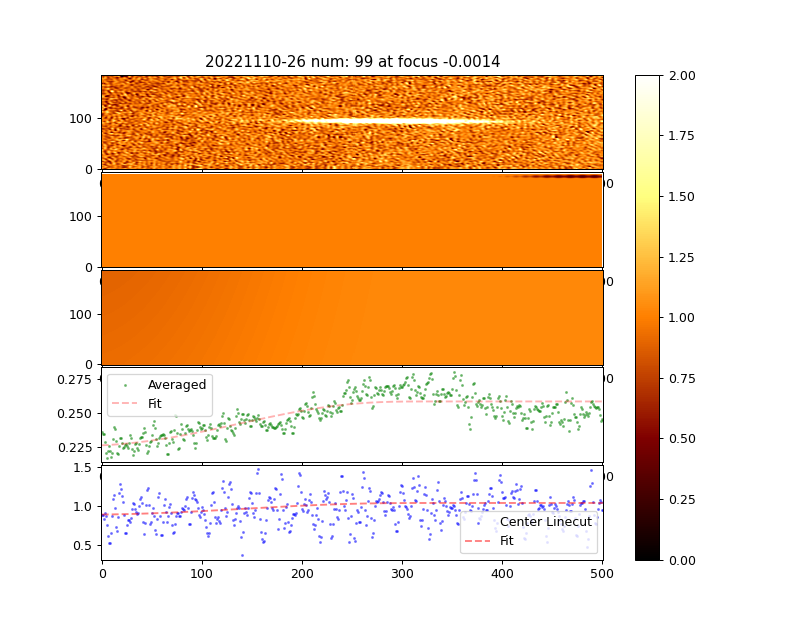

Fitted parameters: 

Offset:          0.0
Amp:             1.0360084081684542
Ang:             1.5618253900907466
Center:          657.2790333293185, 527.7482015192309
TF amp:          0.45952948409597616
TF Width:        371.4581342305045, 1530.4911850952863
j value:         50.0
Axial Amplitude: 0.24695425736780874
x shift:         70.37723222514717
squeeze:         4.045811606771524
--------------------------
Residual Variance: 0.05904583274512618


In [529]:
timeCrystalFit(date, shot, num, dz_focus, quad_cut, multi_loop, straighten=True)

## Fitting 1D Integrated Condensates 

#### Take two - Only fitting the integrated averaged condensate

<i>Let's attempt a different approach; we average the region around the condensate first, and only then try to fit with the 1D TFAX mode.</i>

First, let's loop over all the images in a certain shot. We first fit each of those with a TF model, from which we extract the following parameters:
- <i>x</i> and <i>y</i> coordinates of the center
- <i>x</i> and <i>y</i> widths of the center
- angle 

From those terms we will determine the scissor mode, the dipole modes and the breathing modes for both radial and axial components.
After that, we determine a narrow band along the axial direction of the condensate, and integrate over the radial direction, and then average with the number of linecuts. So we get an average linecut of the condensate. Then, we attempt to fit this 1D data set with a 1D model combining the Thomas-Fermi and the Axial model (still, j-fitting is cumbersome, so we might need to fit that manually first). Finally, we extract all the parameters and fit them using (damped) sinusodal functions.  

What we will also do, or at least attempt, is to keep the TF amplitude constant, and only fit the axial mode - but the problem with that is that we expect some damping - particle loss - and thus the TF amp will not be constant. 

In [170]:
date = 20221212
shot = 155
num = 0
dz_focus = -0.0014
quad_cut = "quad2"
cut = [90, -5, 750, 1250]
multi_loop = 0

In [185]:
### Collecting data ###
total_linecuts = []
track_motion = True

axamps_all = []
odrout_all = []

# Make directory 
save_folder = "/home/bec_lab/Desktop/imgs/{:}_{:}_1DFits/".format(date, shot)
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

save = False
for num in range(2):
    # Generating the data
    atoms, flat, dark, fft_atoms, fft_flat, ang1, amp = fft_analysis(date, shot, num, dz_focus, quad_cut=quad_cut, multi_loop=multi_loop)
    ang_cut = ang1[cut[0]:cut[1], cut[2]:cut[3]]

    indx_center = np.where(ang_cut == ang_cut.min())
    center=(indx_center[0][0], indx_center[1][0])
    print(center)
        
    # Fitting the data - with TF, we only need the position of the condensate. 
    pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout = fitting(ang_cut, 'tf', normalize=True)
    
    # Rotating the image
    pic = rotate(pic, (odrout.beta[2]*(180/np.pi)), mode='reflect')
    fitresult = rotate(fitresult, (odrout.beta[2]*(180/np.pi)), mode='reflect')

    # If 90 degrees off: 
    if pic.shape[0] > pic.shape[1]:
        pic = np.transpose(np.transpose(np.transpose(pic)))
        fitresult = np.transpose(np.transpose(np.transpose(fitresult)))
    
    # Center linecut value
    indx = np.where(fitresult == fitresult.min())
    center_line = indx[0][0]
    
    # The integrated collumns around the condensate
    if odrout.beta[7] < odrout.beta[6]:
        tfxw = odrout.beta[7]
        pic = np.flip(pic, 1)
        fitresult = np.flip(fitresult)
        # Swap if they got fitted wrongly (error with rotation most likely)
        odrout.beta[7], odrout.beta[6] = odrout.beta[6], odrout.beta[7]
        odrout.beta[2] = odrout.beta[2] - np.pi/2
    else:
        tfxw = odrout.beta[6]

    if track_motion:
        # If track motion, then each cut around an image should have a condensate centered. 
        ymid = odrout.beta[4]
        edge_l = int(ymid-150)
        edge_r = int(ymid+150)
    else: 
        # Else, we simply cut a predefined edge. 
        edge_l = 0
        edge_r = 450
    
    tfxw = min(odrout.beta[-2], odrout.beta[-1])
    tl = int(center_line + tfxw)
    bl = int(center_line - tfxw) 
    
    intg_ang = pic[bl:tl].sum(axis=0) / abs(tl-bl)
 
    # Ensure all are the same size
    intg_ang = intg_ang[edge_l:edge_r]
    total_linecuts.append(intg_ang)
    
    intg_ang = -np.log(intg_ang)
    
    # Fit 1D Axial mode profile to each. 
    p0=[1, 153, 160, 1, 57, 0, 1]
    xdata = np.linspace(0,  pic[bl-20:tl+20, edge_l:edge_r].shape[1],  pic[bl-20:tl+20, edge_l:edge_r].shape[1])
    popt, pcov = curve_fit(TFAX_1D, xdata, intg_ang, p0=p0)
    resvarr = (intg_ang - TFAX_1D(xdata, *popt))
    rv = sum([el**2 for el in resvarr])/(len(resvarr) - 2)
    print(p0)
    print(odrout)
    print("amp = ", popt[0],
          "\nmid = ", popt[1],
          "\nr = ", popt[2],
          "\naxamp = ", popt[3],
          "\nj = ", popt[4],
          "\nshift = ", popt[5],
          "\nscale = ", popt[6]
         )

    print(rv)
    
    # Save fitting output to be plotted later. 
    axamps_all.append(popt[3])
    odrout_all.append(odrout.beta)
    
    print(bl, tl)
    print(edge_l, edge_r)
    # Plotting
    vmin = -0
    vmax = 2
    fig, ax = plt.subplots(2, 1, figsize=(8, 8))
    ax[0].imshow(pic[bl-20:tl+20, edge_l:edge_r], vmin=vmin, vmax=vmax, aspect='auto', origin='lower', cmap='afmhot', interpolation='none')
    ax[0].axhline(y=20, ls='--', alpha=0.4)
    ax[0].axhline(y=20+tl-bl, ls='--', alpha=0.4)
    ax[1].scatter(xdata, intg_ang, c='k', alpha=0.5, s=2)
    ax[1].plot(TFAX_1D(xdata, *popt), ls='--', c='r', alpha=0.8)
#     ax[1].plot(TFAX_1D(xdata, *p0), ls='--', c='g', alpha=0.3)
    fig.suptitle("{:} - {:} - {:} ".format(date, shot, num))
    
    if save:
        plt.savefig(save_folder + "/num_{:}.png".format(str(num).zfill(5)))
        plt.close()
        clear_output()
    else:
        plt.show()


if save: 
    # Save the fitted parameters
    np.save(save_folder + "{:}_{:}_odrout.npy".format(date, shot), odrout_all)
    np.save(save_folder + "{:}_{:}_axamps_all.npy".format(date, shot), axamps_all)

Position of peaks:  (array([45]), array([526]))
Found the peak! It is at [45, 526]
(188, 1988) (188, 1988)
(47, 443)
[  0.   1.   0.  47. 443.   1.  10. 150.]
[1, 153, 160, 1, 57, 0, 1]
amp =  0.23094849089669484 
mid =  151.6690994211127 
r =  298.56282373811416 
axamp =  -0.060617376351574805 
j =  57.0 
shift =  -135.72692713078283 
scale =  1.8958859019307581
0.0045185865215890035
37 64
137 437


<IPython.core.display.Javascript object>

Position of peaks:  (array([45]), array([529]))
Found the peak! It is at [45, 529]
(188, 1988) (188, 1988)
(52, 402)
[  0.   1.   0.  52. 402.   1.  10. 150.]
[1, 153, 160, 1, 57, 0, 1]
amp =  0.21672982002418467 
mid =  164.34864085975485 
r =  222.85829811835393 
axamp =  -0.08803622818104807 
j =  57.0 
shift =  -39.661436611837324 
scale =  1.3536432227955175
0.0035597051407529807
31 68
139 439


<IPython.core.display.Javascript object>

In [172]:
np.save(save_folder + "{:}_{:}_odrout.npy".format(date, shot), odrout_all)
np.save(save_folder + "{:}_{:}_axamps_all.npy".format(date, shot), axamps_all)

In [173]:
# Load data from saved files - this way, we can avoid doing the entire processing thing. 
file_folder = "/home/bec_lab/Desktop/imgs/{:}_{:}_1DFits/".format(date, shot)
odrout_all = np.load(file_folder + "{:}_{:}_odrout.npy".format(date, shot))
axamps_all = np.load(file_folder + "{:}_{:}_axamps_all.npy".format(date, shot))

In [182]:
shot = 154
# Load data from saved files - this way, we can avoid doing the entire processing thing. 
file_folder = "/home/bec_lab/Desktop/imgs/{:}_{:}_1DFits/".format(date, shot)
odrout_all = np.load(file_folder + "{:}_{:}_odrout.npy".format(date, shot))
axamps_all = np.load(file_folder + "{:}_{:}_axamps_all.npy".format(date, shot))


n_of_nums = len(odrout_all) # number of images per shot
t_delta = 0.002 # 3 ms between the shots
print(n_of_nums)

# Temp
axamps_all = np.zeros(n_of_nums)

time = np.linspace(0, n_of_nums*t_delta, n_of_nums)
time_d = np.linspace(0, n_of_nums*t_delta, 10000) # for fits we want more data points for a smoother curve

p0s = [[10, 95, 0, 95, 0, 1],      # Angle
       [10, 95, 0, 95, 0, 1],      # X-middle
       [10, 4, 3, 225, 0, 1],       # Y-middle
       [0.25, 190, 0, 1.25, 0, 1], # TF-amplitude
       [10, 190, 0, 95, 0, 1],     # Radial Width 
       [2, 4, 0, 5, 0, 1],         # Axial Width
       [6, 95, 0.45, 0, 1, 1]]    # Axial Amplitude
#      [amp, freq, phase, offset, damping, slope]
       
# Generate data from the odrout_all list
data = []
for i in range(2,8):
    data.append([d[i] for d in odrout_all])
data.append(axamps_all)
par_names = ['Angle', 'X-Center', 'Y-Center', 'TF Amplitude', 'Radial width', 'Axial width', "Ax. Amp"]

# Create a figure
fig, ax = plt.subplots(8, 1, figsize=(9, 9), sharex=True)
outputstr = " {:<13} | {:<12} | {:<12} | {:<12} | {:<12} | {:<12} | {:<12} |".format(" ", "amp", 'freq', 'phase', 'offset', 'damping', 'slope')
print(outputstr)

for i in range(7):
    ax[i].scatter(time, data[i], s=2)
    
# Fitting
for i in range(7):
    popt, pcov = curve_fit(func_damp_lin, time, data[i], p0=p0s[i])
    resvar = np.mean((data[i] - func_damp_lin(time, *popt))**2)
    ax[i].plot(time_d, func_damp_lin(time_d, *popt), c='r', alpha=0.4, label="{:} Hz".format(round(popt[1], 1)))
    ax[i].set_title("{:<12} | {:>12} | {:>19}".format(par_names[i], "f = {:} Hz".format(round(popt[1], 1)), "Res_var = {:}".format(round(resvar, 5))), fontsize=10)
    ax[i].set_title("{:<12} | {:>12}".format(par_names[i], "f = {:} Hz".format(round(popt[1], 1))), fontsize=10)
#     perr = np.sqrt(np.diag(pcov))
#     form_vals = []
#     for j in range(6):
#         form_vals.append(str_with_err(popt[j], perr[j]))
#     fitvarsextracted = "| {:<12} | {:<12} | {:<12} | {:<12} | {:<12} | {:<12} | {:<12} |".format(par_names[i].upper(), *form_vals)
#     print(fitvarsextracted)
#     outputstr += "\n" + fitvarsextracted


tot_amp = np.add(data[3],data[6])
ax[7].scatter(time, tot_amp, s=2)
popt, pcov = curve_fit(func_damp_lin, time, tot_amp, p0=p0s[6])
ax[7].plot(time_d, func_damp_lin(time_d, *popt), c='r', alpha=0.4, label="{:} Hz".format(round(popt[1], 1)))
ax[7].set_title("{:<12} | {:>12}".format("Total amplitude", "f = {:} Hz".format(round(popt[1], 1))), fontsize=10)

plt.suptitle("{:} - {:}".format(date, str(shot).zfill(4)), fontweight="bold")
plt.tight_layout()

# for a in ax:
#     a.set_xlim(0.25, 0.5)
#     if a != ax[-1]:
#         a.set_xticks([])

if True: #Change to True when you want to save. 
    save_folder_dynamical = "/home/bec_lab/Desktop/imgs/dynamical_properties_fits/"
    if not os.path.exists(save_folder_dynamical):
        os.makedirs(save_folder_dynamical)  
    plt.savefig(save_folder_dynamical + "{:}_{:}".format(date, str(shot).zfill(4)))
    with open(save_folder_dynamical + '{:}_{:}_fittedparams.txt'.format(date, str(shot).zfill(4)), 'w') as f:
        f.write(outputstr)
        
plt.show()

130


<IPython.core.display.Javascript object>

               | amp          | freq         | phase        | offset       | damping      | slope        |


RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 1400.

#### Determine ideal j-value - integrated fits

In [207]:
import scipy
### Collecting data ###
total_linecuts = []
track_motion = True

axamps = []
resvars_all = []

# Make directory 
save_folder = "/home/bec_lab/Desktop/imgs/{:}_{:}_1DFits/".format(date, shot)
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

save = False
for num in [34]:
    for j_guess in range(40, 80): 
        # Generating the data
        atoms, flat, dark, fft_atoms, fft_flat, ang1, amp = fft_analysis(date, shot, num, dz_focus, quad_cut=quad_cut, multi_loop=multi_loop)
        ang_cut = ang1[cut[0]:cut[1], cut[2]:cut[3]]
        indx_center = np.where(ang_cut == ang_cut.min())
        center=(indx_center[0][0], indx_center[1][0])
        # Fitting the data - with TF, we only need the position of the condensate. 
        pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout = fitting(ang_cut, 'tf', normalize=True)
        # Rotating the image
        pic = rotate(pic, (odrout.beta[2]*(180/np.pi)), mode='reflect')
        fitresult = rotate(fitresult, (odrout.beta[2]*(180/np.pi)), mode='reflect')
        # If 90 degrees off: 
        if pic.shape[0] > pic.shape[1]:
            pic = np.transpose(np.transpose(np.transpose(pic)))
            fitresult = np.transpose(np.transpose(np.transpose(fitresult)))
        # Center linecut value
        indx = np.where(fitresult == fitresult.min())
        center_line = indx[0][0]
        # The integrated collumns around the condensate
        if odrout.beta[7] < odrout.beta[6]:
            tfxw = odrout.beta[7]
            pic = np.flip(pic, 1)
            fitresult = np.flip(fitresult)
            # Swap if they got fitted wrongly (error with rotation most likely)
            odrout.beta[7], odrout.beta[6] = odrout.beta[6], odrout.beta[7]
            odrout.beta[2] = odrout.beta[2] - np.pi/2
        else:
            tfxw = odrout.beta[6]
        if track_motion:
            # If track motion, then each cut around an image should have a condensate centered. 
            ymid = odrout.beta[4]
            edge_l = int(ymid-150)
            edge_r = int(ymid+150)
        else: 
            # Else, we simply cut a predefined edge. 
            edge_l = 0
            edge_r = 450
        tfxw = min(odrout.beta[-2], odrout.beta[-1])
        tl = int(center_line + tfxw)
        bl = int(center_line - tfxw) 
        intg_ang = pic[bl:tl].sum(axis=0) / abs(tl-bl)
        # Ensure all are the same size
        intg_ang = intg_ang[edge_l:edge_r]
        
        intg_ang = -np.log(intg_ang)

        total_linecuts.append(intg_ang)

        # Fit 1D Axial mode profile to each. 
        p0=[1, 153, 160, 1, j_guess, 0, 1]

        xdata = np.linspace(0,  pic[bl-20:tl+20, edge_l:edge_r].shape[1],  pic[bl-20:tl+20, edge_l:edge_r].shape[1])
        popt, pcov = curve_fit(TFAX_1D, xdata, intg_ang, p0=p0)
        resvarr = (intg_ang - TFAX_1D(xdata, *popt))
        rv = sum([el**2 for el in resvarr])/(len(resvarr) - 2)
        resvars_all.append(rv)
        axamps.append(popt[3])
        clear_output()

<IPython.core.display.Javascript object>


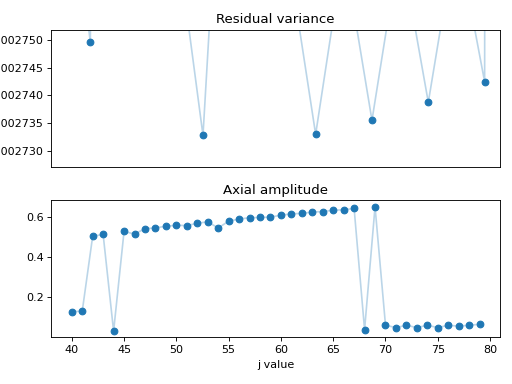

Ideal j parameter:  57


In [103]:
fig, ax = plt.subplots(2,1)
jrange = range(40, 80)

pos_axamps = [abs(i) for i in axamps]

ax[0].scatter(jrange, resvars_all)
ax[0].plot(jrange, resvars_all, alpha=0.3)
ax[1].scatter(jrange, pos_axamps)
ax[1].plot(jrange, pos_axamps, alpha=0.3)
ax[0].set_title("Residual variance")
ax[1].set_title("Axial amplitude")
ax[0].set_xticks([])
ax[1].set_xlabel("j value")
plt.tight_layout()
plt.show()
print("Ideal j parameter: ", jrange[resvars_all.index(min(resvars_all))])

## 2D Fitting 

#### Determine ideal j-value - 2D Fits

We'll have to do a poor-man's fitting for the best mode number, the odr doesn't do a good job. We'll simply loop over different j numbers and compare the residual variances.

In [145]:
jg = range(30, 60)
resvars = []
betas = []
####################################################
for j_guess in jg: 
    print("Calculating for j = {:}".format(j_guess))
    # Generating the data
    atoms, flat, dark, fft_atoms, fft_flat, ang1, amp = fft_analysis(date, shot, num, dz_focus, 
                                                                     quad_cut=quad_cut, multi_loop=multi_loop)
    ang_cut = ang1[cut[0]:cut[1], cut[2]:cut[3]]
    # Fitting the data
    pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout = fitting(ang_cut, 'timecrystal', normalize=True)
#     print(odrout.beta[-1]
#     print(odrout.res_var)
    betas.append(odrout.beta)
    resvars.append(odrout.res_var)
    clear_output(wait=True)
clear_output()

In [146]:
j_vals_all = [x[-3] for x in betas]
ax_amps_all = [x[-2] for x in betas]

Let's investigate how the quality of the fit and the amplitude of the axial mode depend on the j value. 

In [147]:
fig, ax = plt.subplots(2,1)
ax[0].set_ylabel("res_var")
ax[0].set_xlabel("j")
ax[1].set_ylabel("Amplitude Axial Mode")
ax[1].set_xlabel("j")
ax[0].axvline(x=jg[resvars.index(min(resvars))], c='g') # where the minimum value is
ax[1].axvline(x=jg[resvars.index(min(resvars))], c='g') # where the minimum value is
ax[0].scatter(jg, resvars, c='b')
ax[0].plot(jg, resvars, c='b')
ax[1].scatter(jg, ax_amps_all, c='r')
ax[1].plot(jg, ax_amps_all, c='r')
plt.show()
print(jg[resvars.index(min(resvars))])

<IPython.core.display.Javascript object>

50


#### Determining the ideal focus, using time crystals 

Let's try to do the same but now for different focuses. Might be interesting to see if this can give us best information. Since the features are more pronounced, this might give us better results, but keep in mind that the density oscillation peaks might be above the pure condensate, so they might lie in a diffrent focus point. We will use the best j we obtained in the previous part, for 20221110-0016-4, that is 53.

In [150]:
resvars = []
betas = []
foc_range = np.linspace(-0.01, 0.01, 50)
####################################################
for dz_focus in foc_range: 
    print("Calculating for focus = {:}".format(dz_focus))
    # Generating the data
    atoms, flat, dark, fft_atoms, fft_flat, ang1, amp = fft_analysis(date, shot, num, dz_focus, 
                                                                     quad_cut=quad_cut, multi_loop=multi_loop)
    ang_cut = ang1[cut[0]:cut[1], cut[2]:cut[3]]
    # Fitting the data
    pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout = fitting(ang_cut, 'timecrystal', normalize=True)
#     print(odrout.beta[-1])
#     print(odrout.res_var)
    betas.append(odrout.beta)
    resvars.append(odrout.res_var)
    clear_output(wait=True)
clear_output()

In [151]:
ax_amps_all = [x[-1] for x in betas]

In [154]:
fig, ax = plt.subplots(2,1)
ax[0].set_ylabel("res_var")
ax[1].set_ylabel("Amplitude Axial Mode")
ax[1].set_xlabel("Re-Focus")
# ax[0].axvline(x=foc_range[50:-50][resvars[50:-50].index(min(resvars[50:-50]))], c='g') # where the minimum value is
# ax[1].axvline(x=foc_range[50:-50][resvars[50:-50].index(min(resvars[50:-50]))], c='g') # where the minimum value is
ax[0].scatter(foc_range, resvars, c='b', s=2)
# ax[0].plot(foc_range, resvars, c='b')
ax[1].scatter(foc_range, ax_amps_all, c='r', s=2)
# ax[1].plot(foc_range, ax_amps_all, c='r')
plt.show()
plt.tight_layout()
# print("Minimum value at focus = {:}".format(round(foc_range[50:-50][resvars[50:-50].index(min(resvars[50:-50]))], 7)))

<IPython.core.display.Javascript object>

#### Extract Dynamic Properties

Finally, now we can repeate the fitting process for all of the shots in the image loop. Keep in mind that the image is rotated after it has been fitted, so we should also be able to extract the value of the angle from the odrout.beta parameters. Actually, it might be tricky with the rotation, let's keep it as it is.

Position of peaks:  (array([42]), array([682]))
Found the peak! It is at [42, 682]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]


<IPython.core.display.Javascript object>


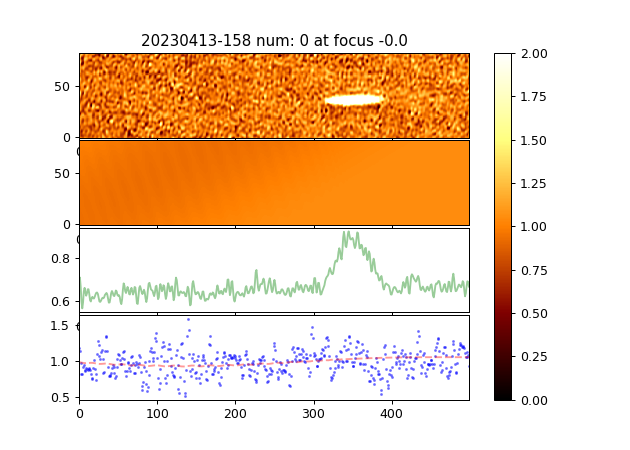

Position of peaks:  (array([42]), array([671]))
Found the peak! It is at [42, 671]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]


<IPython.core.display.Javascript object>


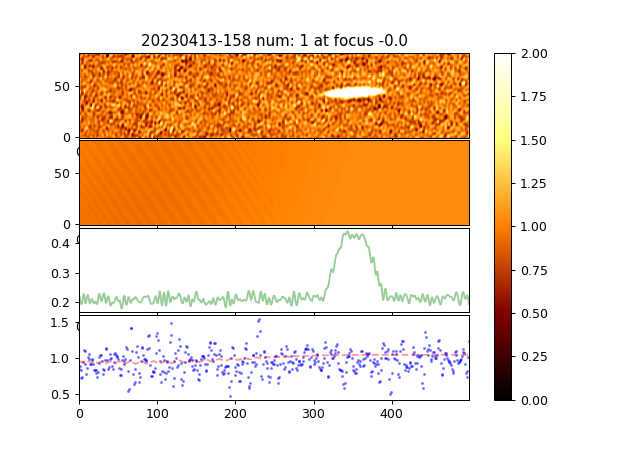

Position of peaks:  (array([42]), array([683]))
Found the peak! It is at [42, 683]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


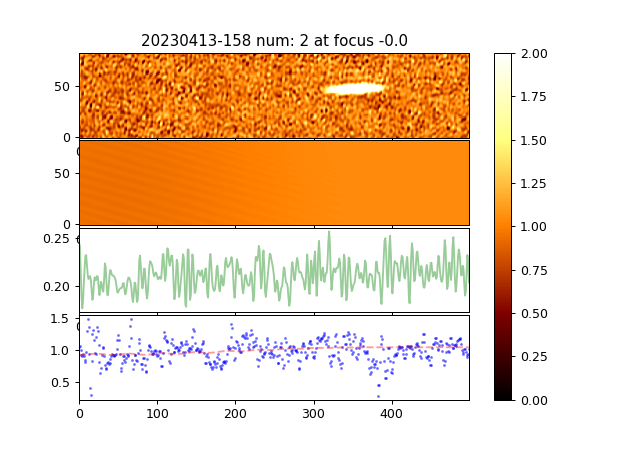

Position of peaks:  (array([42]), array([671]))
Found the peak! It is at [42, 671]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]


<IPython.core.display.Javascript object>


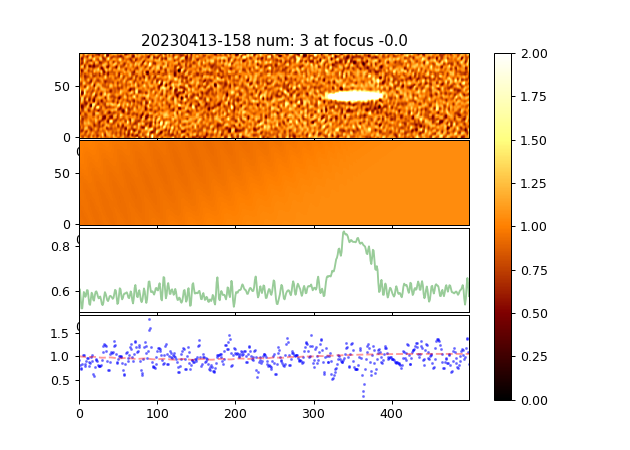

Position of peaks:  (array([42]), array([671]))
Found the peak! It is at [42, 671]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]


<IPython.core.display.Javascript object>


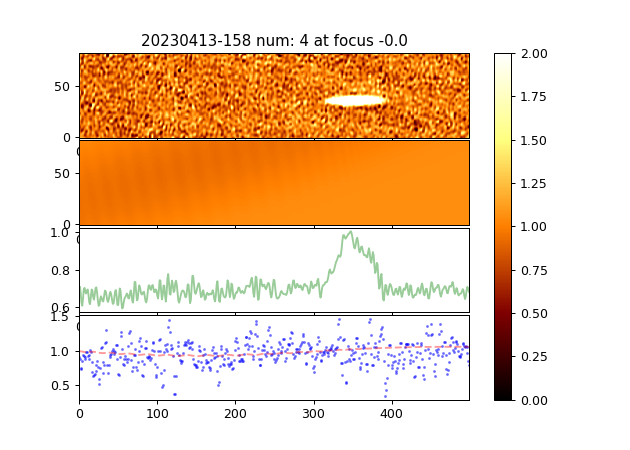

Position of peaks:  (array([42]), array([683]))
Found the peak! It is at [42, 683]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


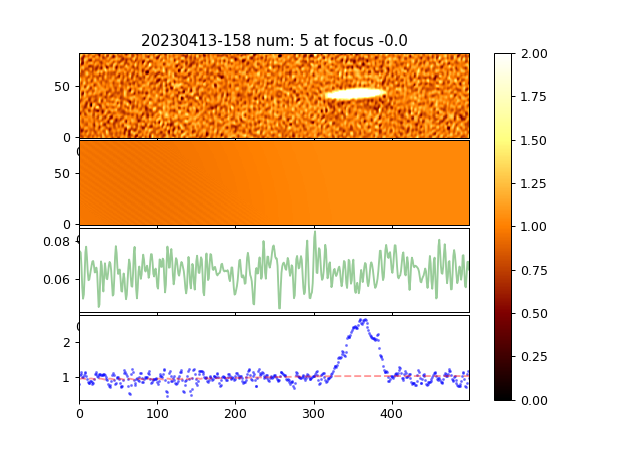

Position of peaks:  (array([42]), array([681]))
Found the peak! It is at [42, 681]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


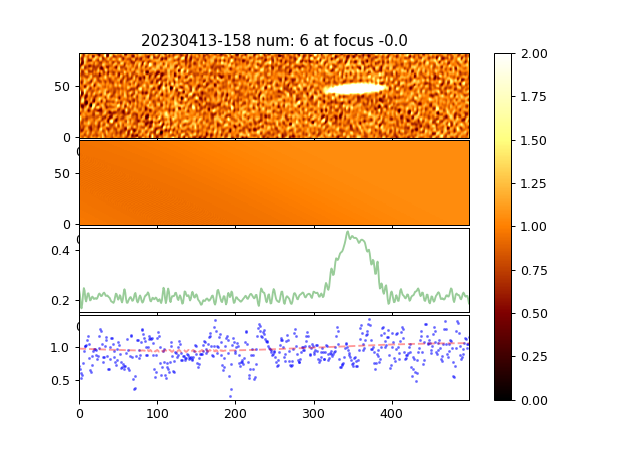

Position of peaks:  (array([42]), array([682]))
Found the peak! It is at [42, 682]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]


<IPython.core.display.Javascript object>


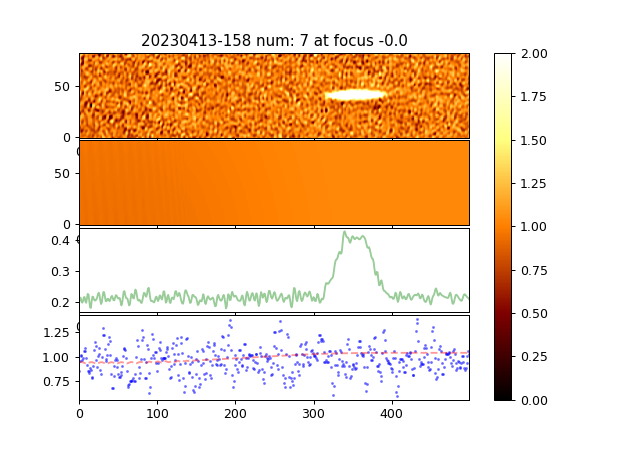

Position of peaks:  (array([42]), array([684]))
Found the peak! It is at [42, 684]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]


<IPython.core.display.Javascript object>


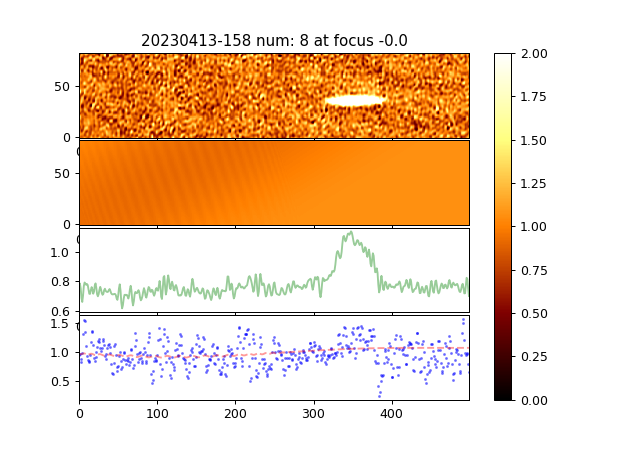

Position of peaks:  (array([42]), array([682]))
Found the peak! It is at [42, 682]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]


<IPython.core.display.Javascript object>


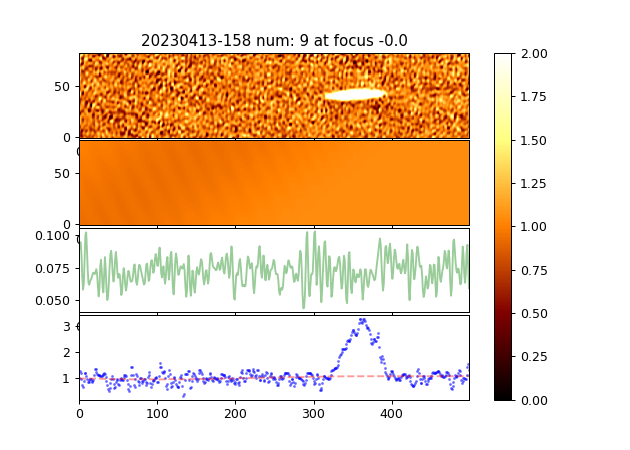

Position of peaks:  (array([42]), array([671]))
Found the peak! It is at [42, 671]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


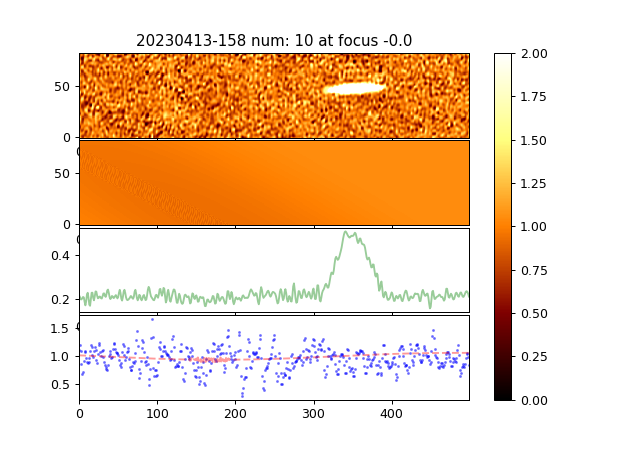

Position of peaks:  (array([42]), array([676]))
Found the peak! It is at [42, 676]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


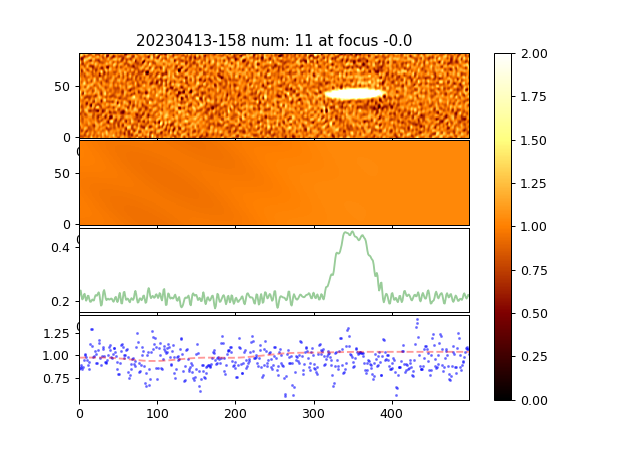

Position of peaks:  (array([42]), array([683]))
Found the peak! It is at [42, 683]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


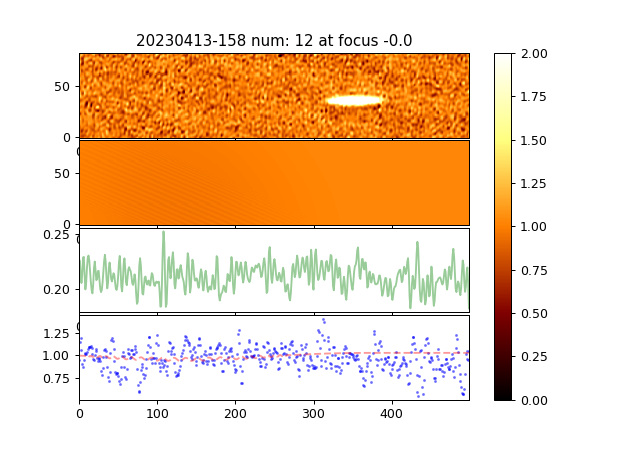

Position of peaks:  (array([42]), array([678]))
Found the peak! It is at [42, 678]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


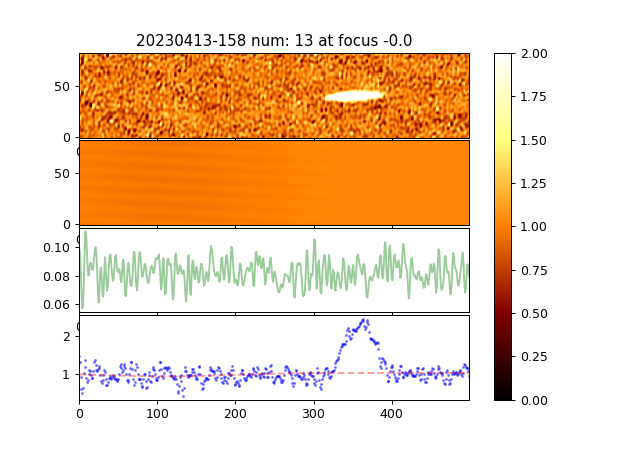

Position of peaks:  (array([42]), array([684]))
Found the peak! It is at [42, 684]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


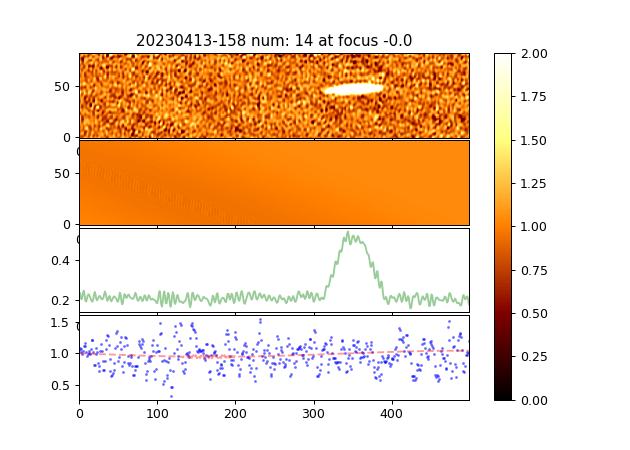

Position of peaks:  (array([42]), array([684]))
Found the peak! It is at [42, 684]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


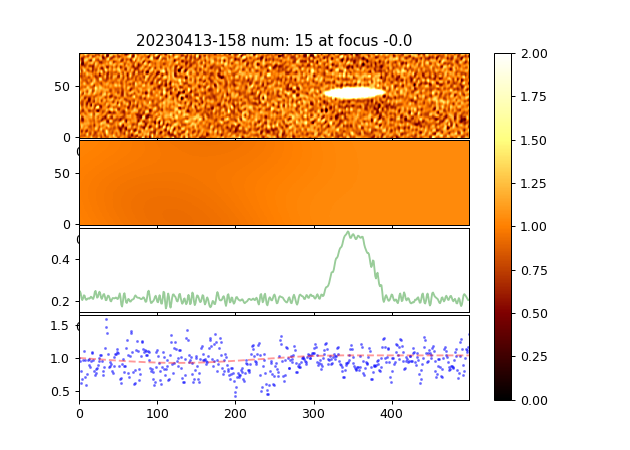

Position of peaks:  (array([42]), array([684]))
Found the peak! It is at [42, 684]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]


<IPython.core.display.Javascript object>


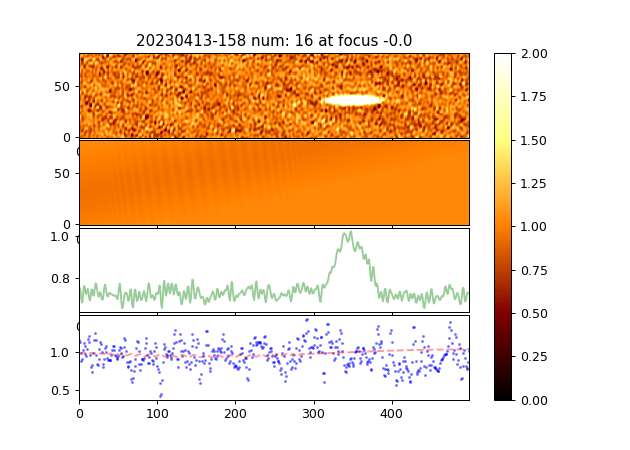

Position of peaks:  (array([42]), array([684]))
Found the peak! It is at [42, 684]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]


<IPython.core.display.Javascript object>


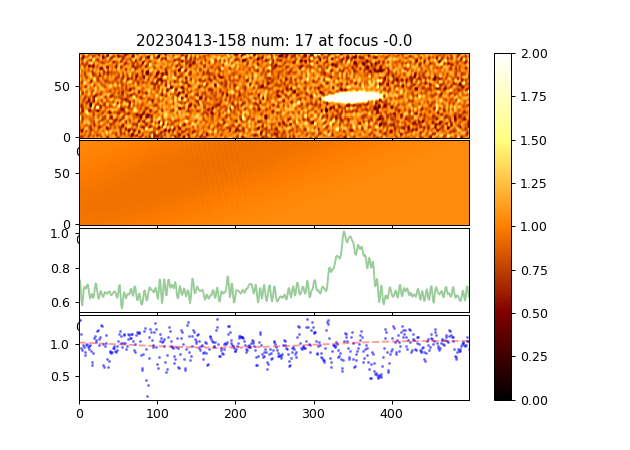

Position of peaks:  (array([42]), array([678]))
Found the peak! It is at [42, 678]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<ipython-input-165-62b12f763f54>:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(7, 5))


<IPython.core.display.Javascript object>


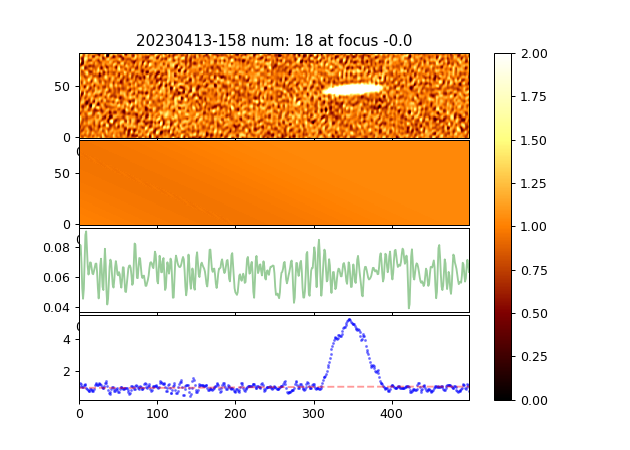

Position of peaks:  (array([42]), array([681]))
Found the peak! It is at [42, 681]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


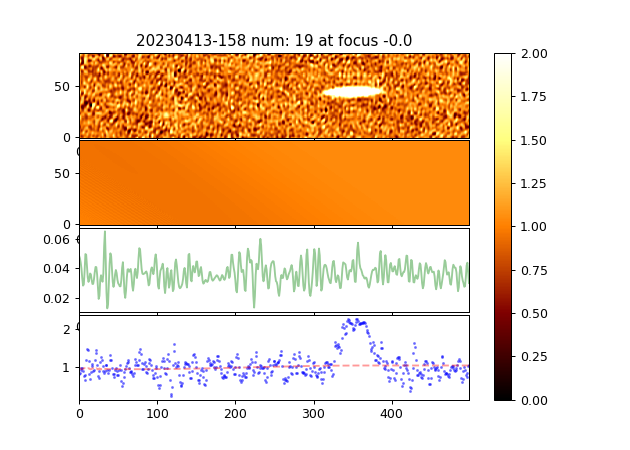

Position of peaks:  (array([42]), array([681]))
Found the peak! It is at [42, 681]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


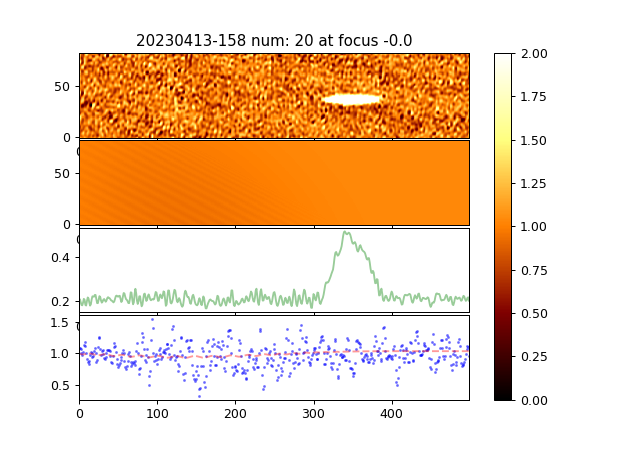

Position of peaks:  (array([42]), array([682]))
Found the peak! It is at [42, 682]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


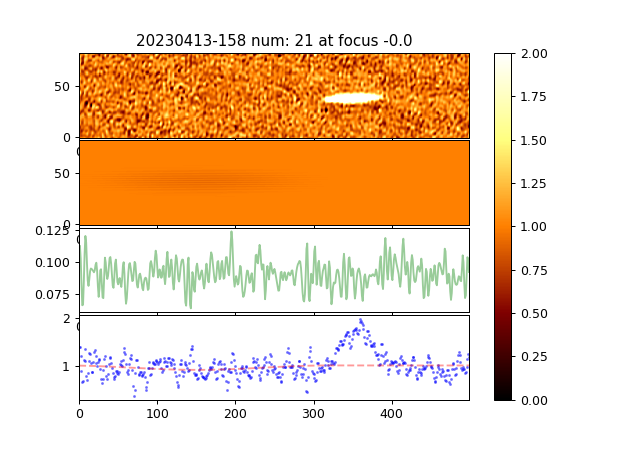

Position of peaks:  (array([42]), array([684]))
Found the peak! It is at [42, 684]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


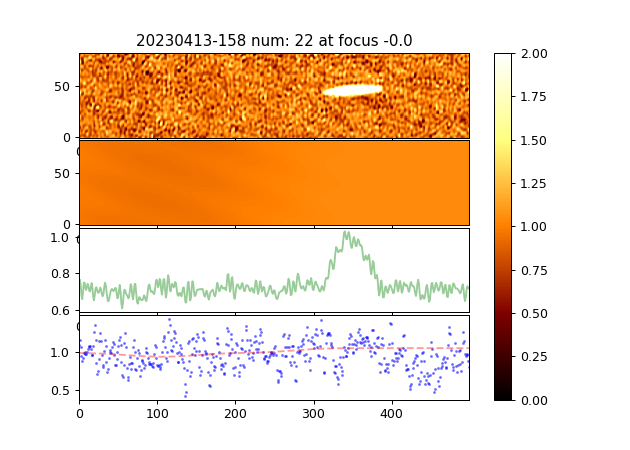

Position of peaks:  (array([42]), array([682]))
Found the peak! It is at [42, 682]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


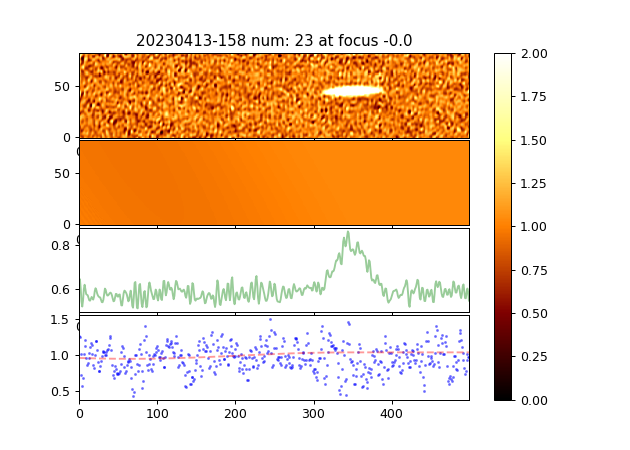

Position of peaks:  (array([42]), array([684]))
Found the peak! It is at [42, 684]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


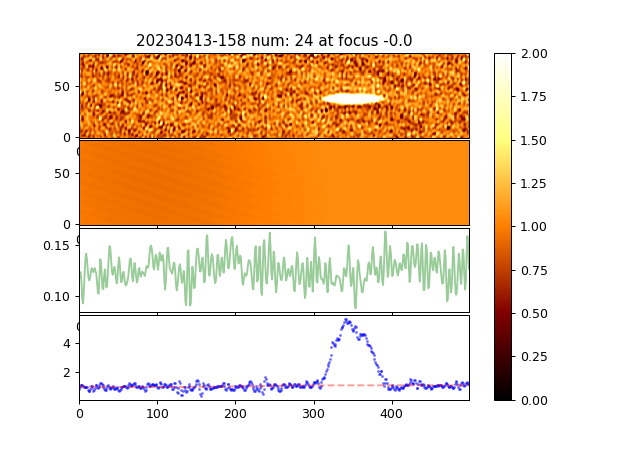

Position of peaks:  (array([42]), array([678]))
Found the peak! It is at [42, 678]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


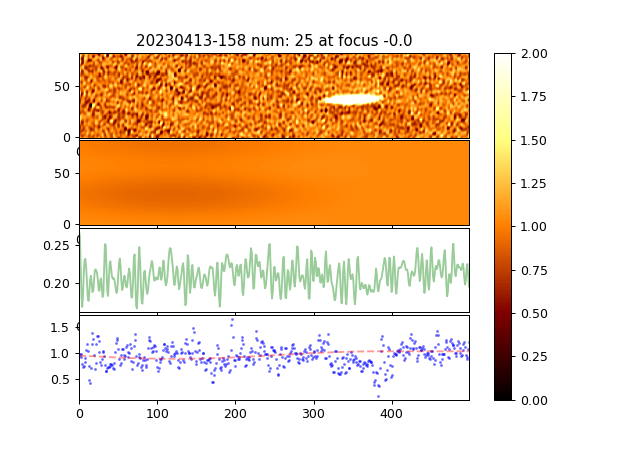

Position of peaks:  (array([42]), array([682]))
Found the peak! It is at [42, 682]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


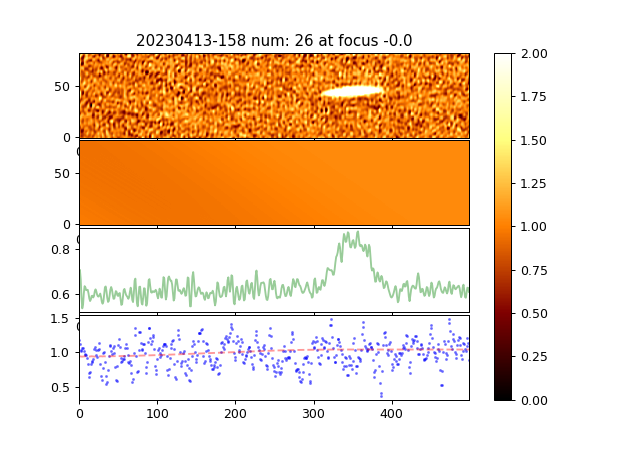

Position of peaks:  (array([42]), array([676]))
Found the peak! It is at [42, 676]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


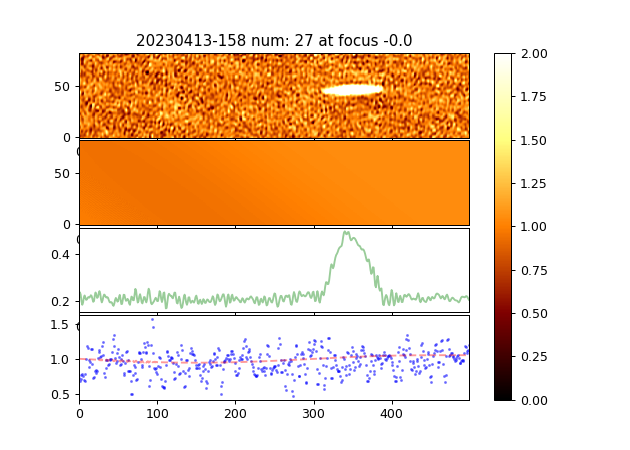

Position of peaks:  (array([42]), array([671]))
Found the peak! It is at [42, 671]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


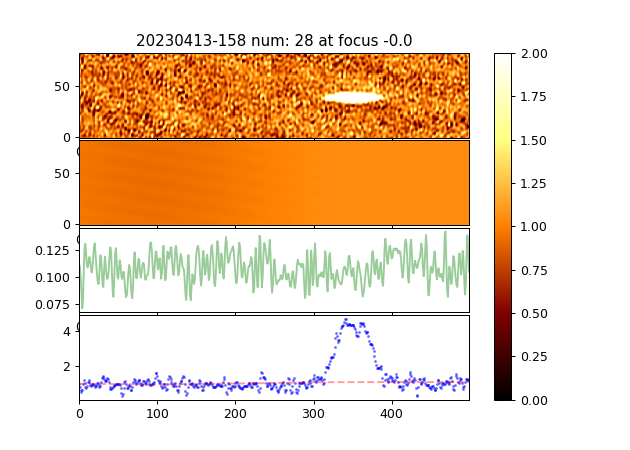

Position of peaks:  (array([42]), array([671]))
Found the peak! It is at [42, 671]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


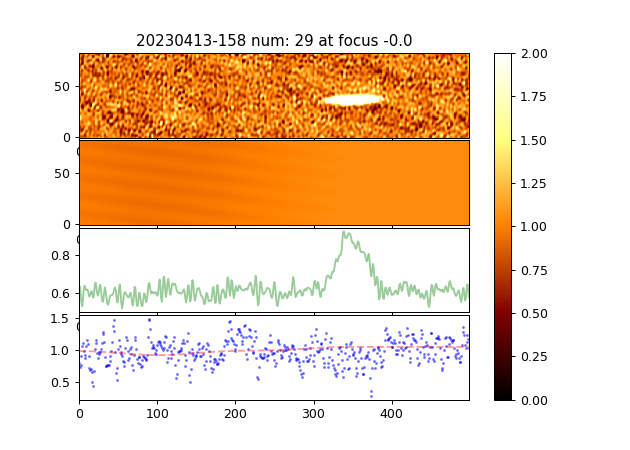

Position of peaks:  (array([42]), array([674]))
Found the peak! It is at [42, 674]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


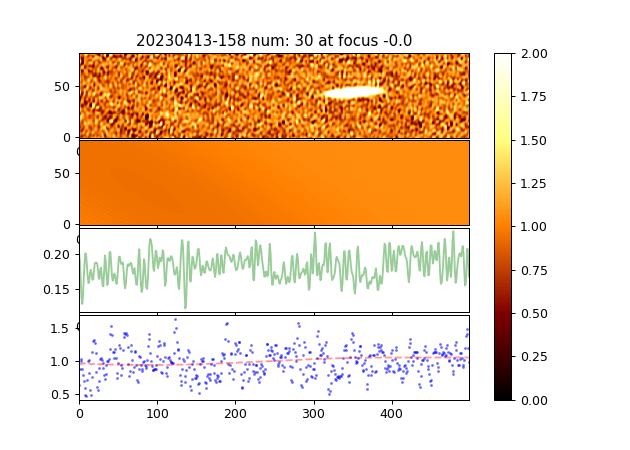

Position of peaks:  (array([42]), array([682]))
Found the peak! It is at [42, 682]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


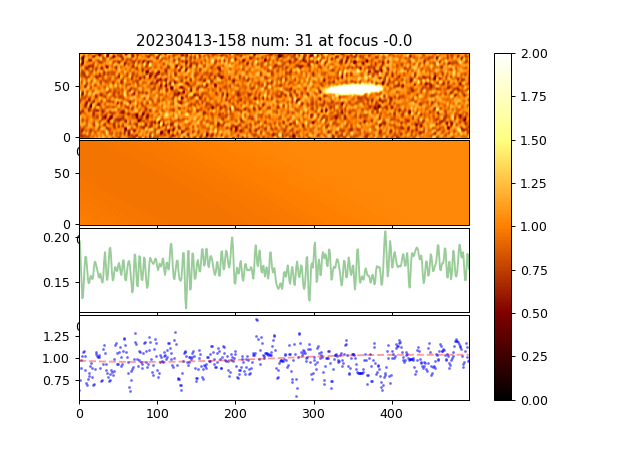

Position of peaks:  (array([42]), array([683]))
Found the peak! It is at [42, 683]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]


<IPython.core.display.Javascript object>


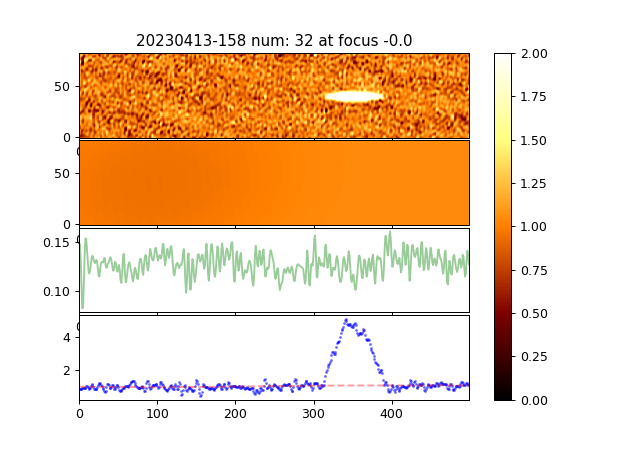

Position of peaks:  (array([42]), array([682]))
Found the peak! It is at [42, 682]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


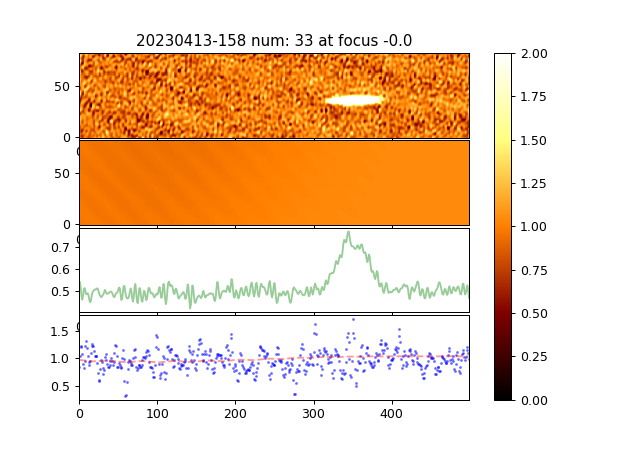

Position of peaks:  (array([42]), array([683]))
Found the peak! It is at [42, 683]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


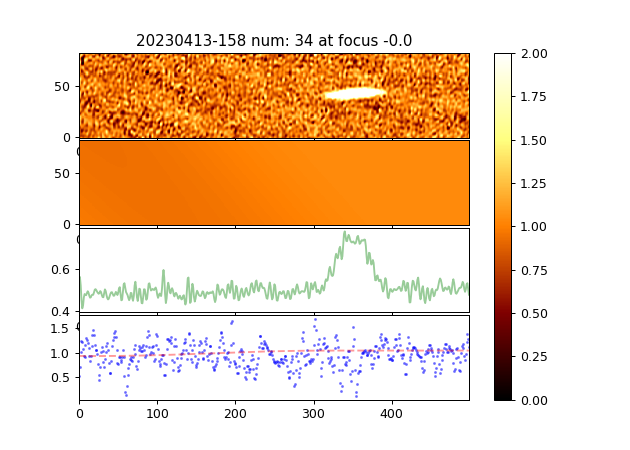

Position of peaks:  (array([42]), array([681]))
Found the peak! It is at [42, 681]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


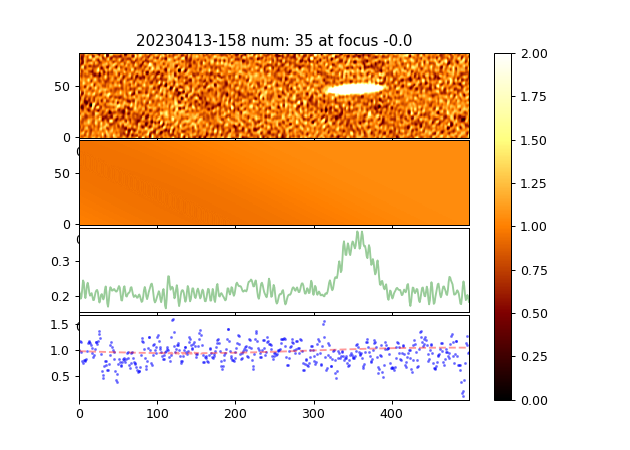

Position of peaks:  (array([42]), array([667]))
Found the peak! It is at [42, 667]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


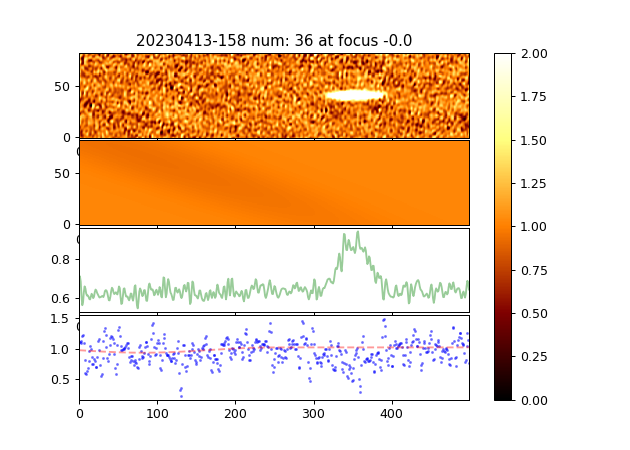

Position of peaks:  (array([42]), array([681]))
Found the peak! It is at [42, 681]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


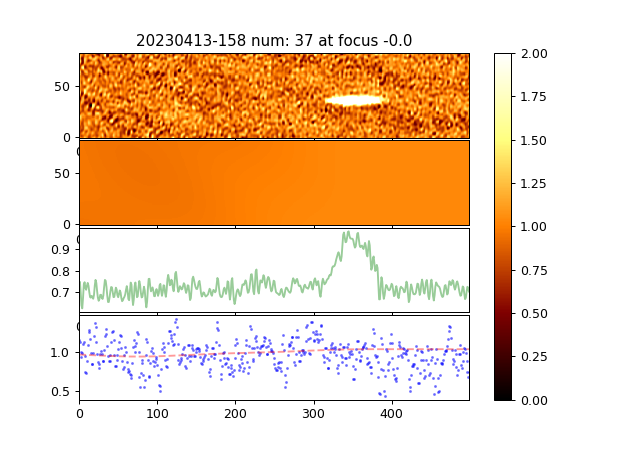

Position of peaks:  (array([42]), array([681]))
Found the peak! It is at [42, 681]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


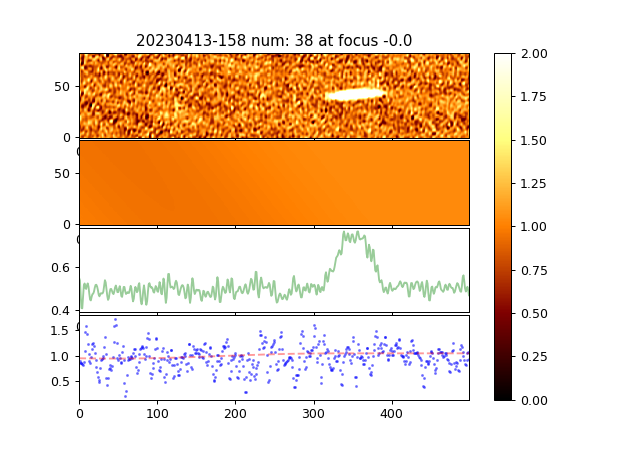

Position of peaks:  (array([42]), array([677]))
Found the peak! It is at [42, 677]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


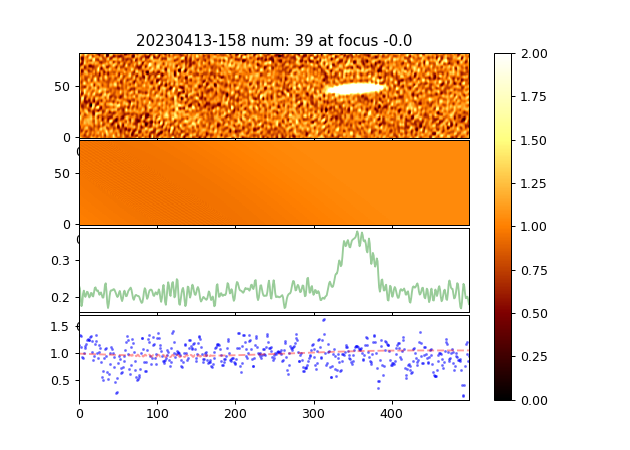

Position of peaks:  (array([42]), array([676]))
Found the peak! It is at [42, 676]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


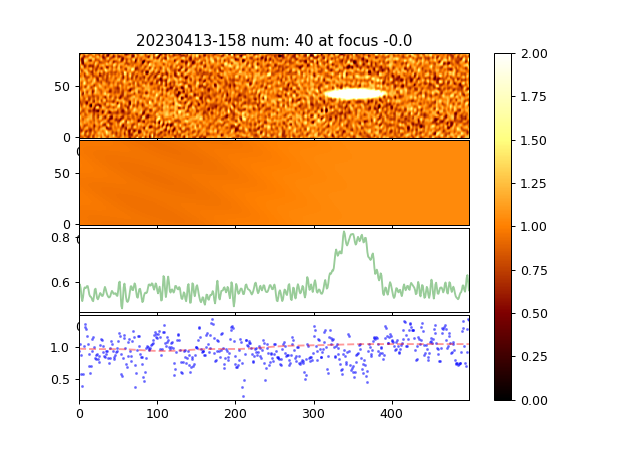

Position of peaks:  (array([42]), array([684]))
Found the peak! It is at [42, 684]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]


<IPython.core.display.Javascript object>


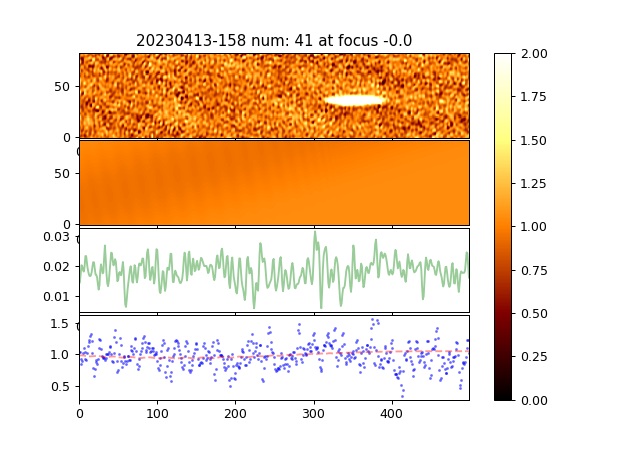

Position of peaks:  (array([42]), array([671]))
Found the peak! It is at [42, 671]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]


<IPython.core.display.Javascript object>


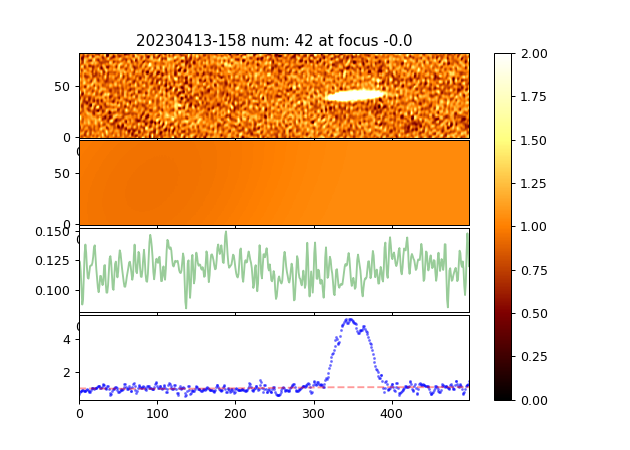

Position of peaks:  (array([42]), array([681]))
Found the peak! It is at [42, 681]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


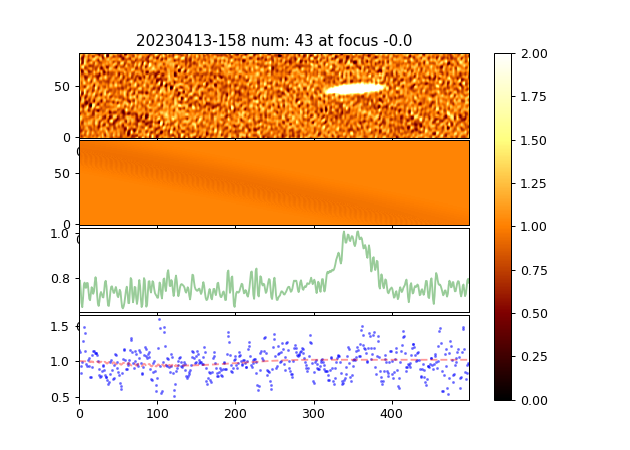

Position of peaks:  (array([42]), array([682]))
Found the peak! It is at [42, 682]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


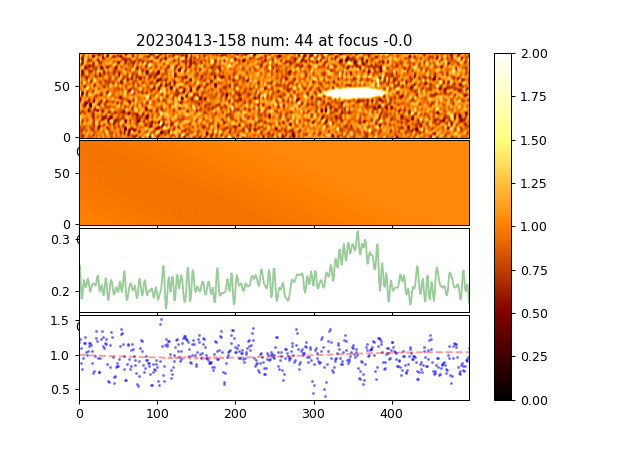

Position of peaks:  (array([42]), array([683]))
Found the peak! It is at [42, 683]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


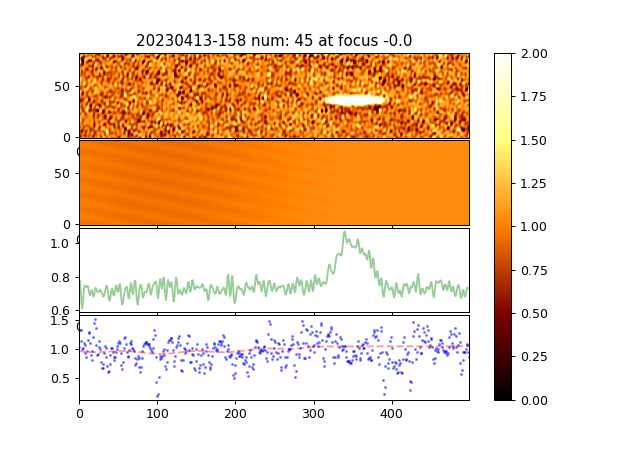

Position of peaks:  (array([42]), array([682]))
Found the peak! It is at [42, 682]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]


<IPython.core.display.Javascript object>


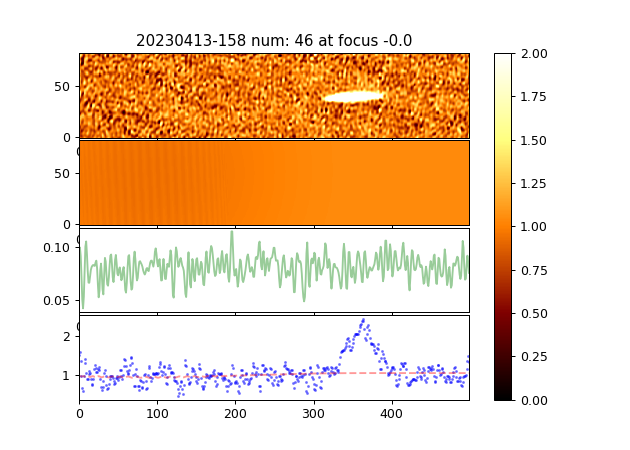

Position of peaks:  (array([42]), array([681]))
Found the peak! It is at [42, 681]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>


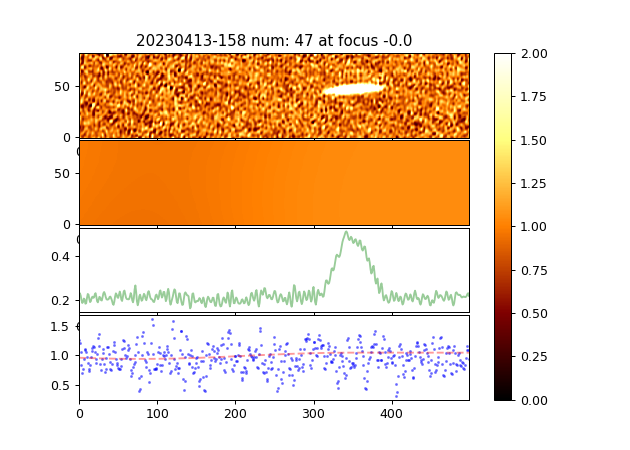

Position of peaks:  (array([42]), array([681]))
Found the peak! It is at [42, 681]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]


<IPython.core.display.Javascript object>


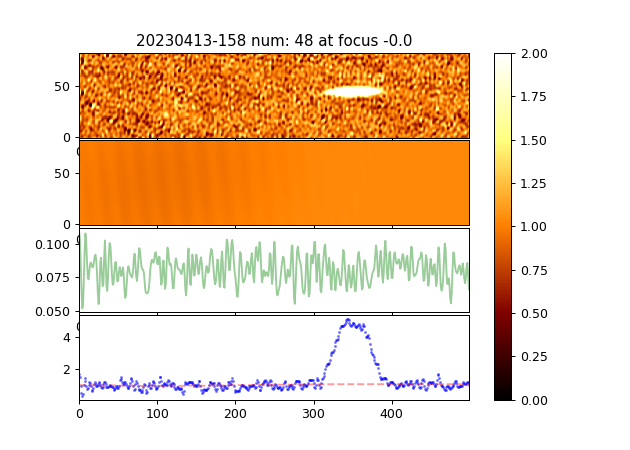

Position of peaks:  (array([42]), array([682]))
Found the peak! It is at [42, 682]
(188, 2548) (188, 2548)
[  0.   1.   0.  47. 156.   1.  10. 150.  53.   1.   0.   1.]


<IPython.core.display.Javascript object>


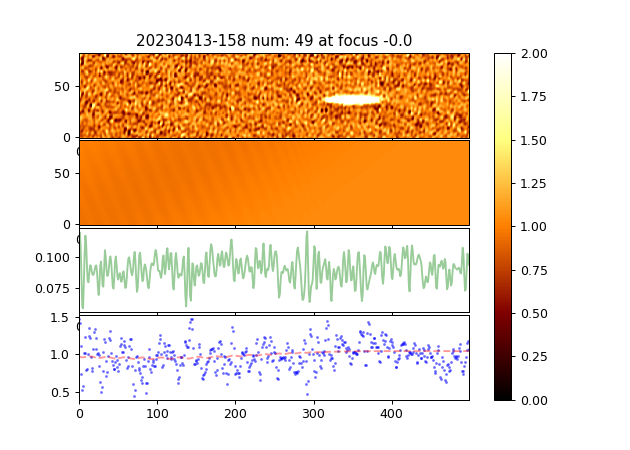

In [165]:
####################################################
####################################################
#         LOOP FOR ANALYSIS
# 
# Fit each image with either the TF profile or 
# TC profile, and extract the parameters. Then fit.
####################################################
####################################################

# Make directory 
save_folder = "/home/bec_lab/Desktop/imgs/2DFits/{:}_{:}/".format(date, shot)
dp = False

if not os.path.exists(save_folder):
    os.makedirs(save_folder)

resvars_all = []
odrout_all = []

# Generating the data
full_path = "/storage/data/{:}/{:}/".format(date, str(shot).zfill(4))

if os.path.exists(full_path + "pics_foc_{:}_{:}.fits".format(quad_cut, dz_focus)):
    print("Analysis previously completed")
    allangs = pyfits.open(full_path + "pics_foc_{:}_{:}.fits".format(quad_cut, dz_focus))[0].data.astype(float)[:]
    dp = True 

for num in range(50):  
    if not dp: 
        atoms, flat, dark, fft_atoms, fft_flat, ang1, amp = fft_analysis(date, shot, num, dz_focus, 
                                                                         quad_cut=quad_cut, multi_loop=multi_loop)
        ang_cut = ang1[cut[0]:cut[1], cut[2]:cut[3]]

    else: 
        ang1 = allangs[num] 
        ang_cut = ang1[cut[0]:cut[1], cut[2]:cut[3]]

    # Fitting the data
    pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout = fitting(ang_cut, 'timecrystal', normalize=True)

    # # Rotating the image, for a nicer linecut
#     pic = rotate(pic, (odrout.beta[2]*(180/np.pi)), mode='reflect')
#     fitresult = rotate(fitresult, (odrout.beta[2]*(180/np.pi)), mode='reflect')

    # If 90 degrees off: 
    if pic.shape[0] > pic.shape[1]:
        pic = np.transpose(np.transpose(np.transpose(pic)))
        fitresult = np.transpose(np.transpose(np.transpose(fitresult)))
    
    # Center linecut value
    indx = np.where(fitresult == fitresult.min())
    center_line = int(indx[0])  

    # # The integrated collumns around the condensate
    tl = int(center_line + odrout.beta[-4])
    bl = int(center_line - odrout.beta[-4]) 
    intg_ang = pic[bl:tl].sum(axis=0) 

    # Plotting
    fig = plt.figure(figsize=(7, 5))
    gs = GridSpec(4, 1, wspace=0.0, hspace=0.030)
    ax1 = fig.add_subplot(gs[0])
    ax2 = fig.add_subplot(gs[1], sharex=ax1, sharey=ax1)
    ax3 = fig.add_subplot(gs[2], sharex=ax1)
    ax4 = fig.add_subplot(gs[3], sharex=ax1)
    vmin = -0
    vmax = 2

    im = ax1.imshow(pic, vmin=vmin, vmax=vmax, aspect='auto', origin='lower', cmap='afmhot', interpolation='none')
#     ax1.axhline(y=center_line, alpha=0.4, ls='--')
    ax2.imshow(fitresult, vmin=vmin, vmax=vmax, aspect='auto', origin='lower', cmap='afmhot', interpolation='none')
    ax3.plot(intg_ang/(tl-bl), c='g', alpha=0.4, label="Averaged integrated around the condensate")
    ax4.plot(fitresult[center_line], c='r',ls='--', alpha=0.4, label="Linecut through the center of the fit")
    ax4.scatter(range(len(pic[center_line])), pic[center_line], c='b', alpha=0.4, s=2, label="Linecut through the center of the condensate")
    plt.colorbar(im, ax=[ax1, ax2, ax3, ax4])
    ax1.set_title("{:}-{:} num: {:} at focus {:}".format(date, shot, num, round(dz_focus, 5)))
#     ax3.set_title("Averaged integrated around the condensate")
#     ax4.set_title("Linecut through the center of the condensate, fitted")
#     ax3.legend()
#     ax4.legend()
#     plt.tight_layout()
    plt.show()
    
    if odrout.beta[7] < odrout.beta[6]:
        # Swap if they got fitted wrongly
        odrout.beta[7], odrout.beta[6] = odrout.beta[6], odrout.beta[7]
        odrout.beta[2] = odrout.beta[2] - np.pi/2
        
    resvars_all.append(odrout.res_var)
    
    odrout_all.append(odrout.beta)
#     plt.savefig(save_folder + "/num_{:}.png".format(str(num).zfill(5)))
#     plt.close()
#     clear_output()


In [167]:
fitresults_2dfit = fitresult.copy()

<IPython.core.display.Javascript object>


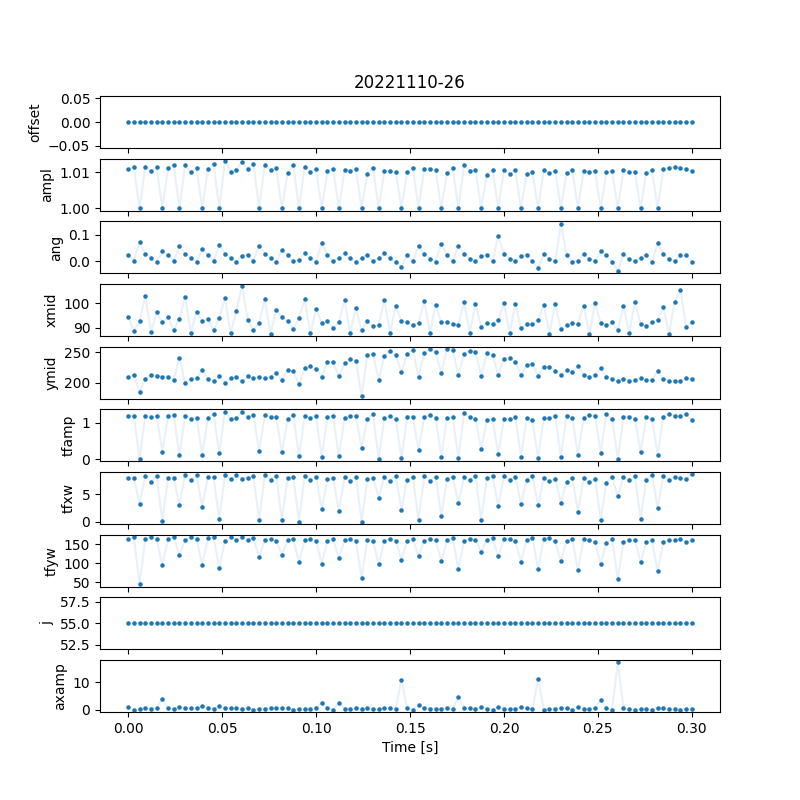

In [22]:
fig, ax = plt.subplots(10, figsize=(8,8), sharex=True)
par_names = ['offset', 'ampl', 'ang', 'xmid', 'ymid', 'tfamp', 'tfxw', 'tfyw', "j", "axamp"]
time = np.linspace(0, 0.003*len(odrout_all), len(odrout_all))
time_d = np.linspace(0, 0.003*len(odrout_all), len(odrout_all))
ax[0].set_title("{:}-{:}".format(date, shot))

for i in range(10): 
    data = [d[i] for d in odrout_all]
    if i == 2:
        data = [(x - np.pi/2) if x > 1 else x for x in data]  
        ax[i].scatter
    ax[i].scatter(time, data, s=5)
    ax[i].plot(time, data, alpha=0.1)
#     popt, pcov = curve_fit(func, time, data, p0s[i])
#     if i == 0:
#         ax[i].plot(time_d, np.linspace(0, 0, 249), c='r', ls='--')
#     else:
#         ax[i].plot(time_d, func(time_d, *popt), c='r', ls='--', label="{:} Hz".format(round(popt[1], 1)))
# #         ax[i].plot(time_d, func(time_d, *p0s[i]), c='b', ls='--', alpha=0.2)
#         ax[i].legend()
    ax[i].set_ylabel(par_names[i])
   # if i != 9:
       # ax[i].set_xticks([])
ax[9].set_xlabel("Time [s]")
plt.show()

#### Making the Fourier Plot

Might be worth making also the "Fourier" plot that Jasper and Peter made for the first paper, where they integrate along x (or z, doesn't matter), and plot the sum as each line in a new plot - so a space vs time plot. 

In [527]:
total_linecuts = []
track_motion = False

# Make directory 
save_folder = "/home/bec_lab/Desktop/imgs/FourierPlots/{:}_{:}_Fourierplotting/".format(date, shot)
if not os.path.exists(save_folder):
    os.makedirs(save_folder)

for num in range(100):
    # Generating the data
    atoms, flat, dark, fft_atoms, fft_flat, ang1, amp = fft_analysis(date, shot, num, dz_focus, 
                                                                     quad_cut=quad_cut, multi_loop=multi_loop)
    ang_cut = ang1[cut[0]:cut[1], cut[2]:cut[3]]

    indx_center = np.where(ang_cut == ang_cut.min())
    center=(indx_center[0][0], indx_center[1][0])
    print(center)
    # Initial values - guess
    ang = 0 
    tfa, tfw = 1, (5, 100)
    ####################################################
    
    # Fitting the data
    pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout = fitting(ang_cut, 'tf', normalize=True)

#     Rotating the image
    pic = rotate(pic, (odrout.beta[2]*(180/np.pi)), mode='reflect')
    fitresult = rotate(fitresult, (odrout.beta[2]*(180/np.pi)), mode='reflect')

    # If 90 degrees off: 
    if pic.shape[0] > pic.shape[1]:
        pic = np.transpose(np.transpose(np.transpose(pic)))
        fitresult = np.transpose(np.transpose(np.transpose(fitresult)))
    
    # Center linecut value
    indx = np.where(fitresult == fitresult.min())
    center_line = indx[0][0]
    
    # The integrated collumns around the condensate
    if odrout.beta[7] < odrout.beta[6]:
        tfxw = odrout.beta[7]
        pic = np.flip(pic, 1)
        fitresult = np.flip(fitresult)
    else:
        tfxw = odrout.beta[6]
    
    
    if track_motion:
        # If track motion, then each cut around an image should have a condensate centered. 
        ymid = odrout.beta[4]
        edge_l = int(ymid-150)
        edge_r = int(ymid+150)
    else: 
        # Else, we simply cut a predefined edge. 
        edge_l = 0
        edge_r = 450
    
    tfxw = min(odrout.beta[-2], odrout.beta[-1])
    
    tl = int(center_line + tfxw)
    bl = int(center_line - tfxw) 
    print(tl, bl, center_line, odrout.beta)
    
    intg_ang = pic[bl:tl].sum(axis=0) / abs(tl-bl)
 
    # Ensure all are the same size
    intg_ang = intg_ang[edge_l:edge_r]
    total_linecuts.append(intg_ang)
    
    # Plotting
    vmin = -0
    vmax = 2
    fig, ax = plt.subplots(5, 1, figsize=(7, 5))
    ax[0].imshow(pic[:, edge_l:edge_r], vmin=vmin, vmax=vmax, aspect='auto', origin='lower', cmap='afmhot', interpolation='none')
    ax[1].imshow(fitguess[bl:tl], vmin=vmin, vmax=vmax, aspect='auto', origin='lower', cmap='afmhot', interpolation='none')
    ax[2].imshow(fitresult[:, edge_l:edge_r], vmin=vmin, vmax=vmax, aspect='auto', origin='lower', cmap='afmhot', interpolation='none')
    ax[3].imshow(pic[bl:tl], vmin=vmin, vmax=vmax, aspect='auto', origin='lower', cmap='afmhot', interpolation='none')
    ax[4].plot(intg_ang)
    plt.savefig(save_folder + "/num_{:}.png".format(str(num).zfill(5)))
    plt.close()
    clear_output()
    
    

In [528]:
from matplotlib.colors import LogNorm

fft_tot_lin = np.fft.fft2(total_linecuts)
shift = np.fft.fftshift(fft_tot_lin)


fig, ax = plt.subplots(2,1,  figsize=(10, 8))
plt.suptitle("{:}_{:}".format(date, shot))
im1 = ax[0].imshow(total_linecuts, aspect='auto', cmap='afmhot')
ax[1].set_title("FFT Shift of the image")
im2 = ax[1].imshow(abs(shift), aspect='auto', cmap='afmhot', norm=LogNorm(vmin=0.1, vmax=200))
plt.colorbar(im1, ax=ax[0])
plt.colorbar(im2, ax=ax[1])
plt.tight_layout()
plt.show()


<IPython.core.display.Javascript object>

#### Noise investigation

Let's see how much noise there is in that image - taking linecuts through the background where no condensate is present, calculating the standard deviation. 

In [47]:
fig = plt.figure(figsize=(7, 5))
gs = GridSpec(4, 1, wspace=0.0, hspace=0.030)
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1], sharex=ax1, sharey=ax1)
ax3 = fig.add_subplot(gs[2], sharex=ax1)
ax4 = fig.add_subplot(gs[3], sharex=ax1)
vmin = 0.5
vmax = 1.5
all_lcuts = []
for i in range(30):
    ax1.axhline(y=center_line+10+i, alpha=0.4, ls='--')
    ax3.plot(pic[center_line+10+i], alpha=0.2)
    all_lcuts.append(pic[center_line+10+i])

avg_lcuts = np.array(all_lcuts).sum(axis=0)/i 
    
ax1.axhline(y=center_line, alpha=0.7, ls='--', c='r')
ax3.plot(pic[center_line], c='r')
ax3.plot(intg_ang/(tl-bl), c='b')
im = ax1.imshow(pic, vmin=vmin, vmax=vmax, aspect='auto', origin='lower', cmap='afmhot', interpolation='none')
ax2.imshow(fitresult, vmin=vmin, vmax=vmax, aspect='auto', origin='lower', cmap='afmhot', interpolation='none')
ax4.plot(avg_lcuts, alpha=0.4, label="StDev = {:}".format(round(np.std(avg_lcuts), 4)))
ax4.axhline(y=np.mean(avg_lcuts), c='g', ls='--', label="Mean = {:}".format(round(np.mean(avg_lcuts), 4)))
plt.legend()

plt.colorbar(im, ax=[ax1, ax2, ax3, ax4])
ax1.set_title("{:}-{:} num: {:} at focus {:}".format(date, shot, num, round(dz_focus, 5)))
plt.show()

<IPython.core.display.Javascript object>

#### Axial Mode Investigation

In [26]:
atoms, flat, dark, fft_atoms, fft_flat, ang1, amp = fft_analysis(date, shot, num, dz_focus, quad_cut="quad2")
ang_cut = ang1[cut[0]:cut[1], cut[2]:cut[3]]
pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout = fitting(ang_cut, 'tf', normalize=True)

Position of peaks:  (array([70]), array([520]))
Found the peak! It is at [70, 520]
(288, 1988) (288, 1988)
[  0.   1.   0. 100. 200.   1.   5. 100.]


In [105]:
plt.figure(figsize=(8, 3))
plt.imshow(fitguess, vmin=vmin, vmax=vmax, aspect='auto', origin='lower', cmap='afmhot', interpolation='none')
plt.show()

<IPython.core.display.Javascript object>

NameError: name 'vmin' is not defined

In [61]:
def L(z, j):
    """    Difference between the j+2'th and the j'th Legendre polynomials    """
    legendre_sum = eval_legendre(j+2, z) - eval_legendre(j, z)
    legendre_sum *= np.piecewise(z, [abs(z) <=1, abs(z) > 1], [1, 0])
    return legendre_sum

def thomasFermiAxialMode(x, amp, r, mid, j, axamp, b, c):
    """ 
        A 2D Thomas Fermi function, a function of amplitude, radia and means (both x and y). 
        Uf what, this function for some reason seems pretty good. It seems to match Jasper's figure 6.2 
        (from his PhD thesis), with the 
    """
    value = 1 - ((x[0] - mid[0]) / r[0]) ** 2 - ((x[1] - mid[1]) / r[1]) ** 2
    value[value < 0] = 0
    return (np.abs(amp) * np.power(value, 3. / 2.) + axamp*L(b*x[0]+c, j)) * np.abs(amp) * np.power(value, 3. / 2.) 


In [63]:
x = np.linspace(-1.5, 1.5, 1001)
z = np.linspace(-1.5, 1.5, 1001)
X, Z = np.meshgrid(x, z)

pic = np.exp(-thomasFermiAxialMode((X, Z), 1, (1, -.1), (0, 0), 53, 1, 0.75, 0))
pic2 = thomasFermiAxialMode((X, Z), 1, (1, -.1), (0, 0), 53, 1, 1, 0)

fig, ax = plt.subplots(2, 2, sharex=True)
im = ax[0][0].imshow(pic, vmin=-0.5, vmax=1.25, aspect='auto', origin='lower', cmap='afmhot_r', interpolation='none')
im = ax[0][1].imshow(pic2, vmin=-0.5, vmax=1.25, aspect='auto', origin='lower', cmap='afmhot_r', interpolation='none')
for i in range(1):
    ax[1][0].plot(pic[500], c='r', alpha=0.51)
    ax[1][1].plot(pic2[500], c='r', alpha=0.30)
plt.colorbar(im, ax=ax)
plt.show()

<IPython.core.display.Javascript object>

## Investigating Damping Rates As A Function of Temperature

Here we investigate damping rates as a function of temperature / condensation fraction. Shots 0154 - 0174.

In [49]:
# Initialize The Date  
date = 20221212
shot = 231 # Not needed really.
num = 8
dz_focus = 0.0
quad_cut = "quad2"
cut = [90, -5, 750, 1250]
multi_loop = 0

In [50]:
# Initial values - guess
ang = 0 
center = (40, 200)
tfa, tfw = 1, (10, 150)
ga, gw = 1, (30, 20)
j_guess = 50
axamp = 1
x_shift = 0
squeeze_par = 1
# par_names = ['offset', 'ampl', 'ang', 'xmid', 'ymid', 'tfamp', 'tfxw', 'tfyw', 'gamp', 'gxw', 'gyw']
# par_names_timecrystal = ['offset', 'ampl', 'ang', 'xmid', 'ymid', 'tfamp', 'tfxw', 'tfyw', 'j', 'j_amp', 'x_shift', 'squeeze_par']

#### 1D Fitting

In [149]:
for shot in [231]: #[82, 83, 84, 85, 86, 87, 88, 89, 90, 97, 92, 94]: #range(154, 175):
    # Generate empty array to append the data to 
    total_linecuts = []
    axamps_all = []
    odrout_all = []
    track_motion = True
    save = True
    dp = False # Variable for data pre-processing
    
    # Make directory if it doens't exist
    save_folder = "/home/bec_lab/Desktop/imgs/1DFits/{:}_{:}_1DFits/".format(date, shot)
    
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)
    
    # To make it faster we can load the pre-processed file. 
    full_path = "/storage/data/{:}/{:}/".format(date, str(shot).zfill(4))
    
    if os.path.exists(full_path + "pics_foc_{:}_{:}.fits".format(quad_cut, dz_focus)):
        print("Analysis previously completed")
        allangs = pyfits.open(full_path + "pics_foc_{:}_{:}.fits".format(quad_cut, dz_focus))[0].data.astype(float)[:]
        dp = True        
        
    for num in range(50):
        print("Analyzing and plotting: SHOT: {:} -- {:}/250".format(shot, num+1))
        # Generating the data
        if not dp:
            atoms, flat, dark, fft_atoms, fft_flat, ang1, amp = fft_analysis(date, shot, num, dz_focus, quad_cut=quad_cut, multi_loop=multi_loop)
        else:
            ang1 = allangs[num]
        
        ang_cut = ang1[cut[0]:cut[1], cut[2]:cut[3]]
        
        # Get the rough center position
        indx_center = np.where(ang_cut == ang_cut.min())
#         center=(indx_center[0][0], indx_center[1][0])

        # Fitting the data - with TF first
        pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout = fitting(ang_cut, 'tf', normalize=True)

        # Rotating the image
        pic = rotate(pic, (odrout.beta[2]*(180/np.pi)), mode='reflect')
        fitresult = rotate(fitresult, (odrout.beta[2]*(180/np.pi)), mode='reflect')

        # If 90 degrees off: 
        if pic.shape[0] > pic.shape[1]:
            pic = np.transpose(np.transpose(np.transpose(pic)))
            fitresult = np.transpose(np.transpose(np.transpose(fitresult)))

        # Center linecut value
        indx = np.where(fitresult == fitresult.min())
        center_line = indx[0][0]

        # The integrated collumns around the condensate
        if odrout.beta[7] < odrout.beta[6]:
            tfxw = odrout.beta[7]
            pic = np.flip(pic, 1)
            fitresult = np.flip(fitresult)
            # Swap if they got fitted wrongly (error with rotation most likely)
            odrout.beta[7], odrout.beta[6] = odrout.beta[6], odrout.beta[7]
            odrout.beta[2] = odrout.beta[2] - np.pi/2
        else:
            tfxw = odrout.beta[6]

        if track_motion:
            # If track motion, then each cut around an image should have a condensate centered. 
            ymid = odrout.beta[4]
            edge_l = int(ymid-150)
            edge_r = int(ymid+150)
        else: 
            # Else, we simply cut a predefined edge. 
            edge_l = 0
            edge_r = 450

        tfxw = min(odrout.beta[-2], odrout.beta[-1])
        tl = int(center_line + tfxw)
        bl = int(center_line - tfxw) 

        intg_ang = pic[bl:tl].sum(axis=0) / abs(tl-bl)

        # Ensure all are the same size
        intg_ang = intg_ang[edge_l:edge_r]
        total_linecuts.append(intg_ang)
        intg_ang = -np.log(intg_ang)

        # Fit 1D Axial mode profile to each.
        p0=[1, 150, 130, 1, 51, 0, 1]
        try: 
            xdata = np.linspace(0,  pic[bl-20:tl+20, edge_l:edge_r].shape[1],  pic[bl-20:tl+20, edge_l:edge_r].shape[1])
            popt, pcov = curve_fit(TFAX_1D, xdata, intg_ang, p0=p0)
        except: 
            pass
        
        # Save fitting output to be plotted later. 
        odrout_all.append(odrout.beta)
        axamps_all.append(popt[3]) # If the fit is not successful, then the result for the previous run is appended. 
        
        
        # Plotting
        vmin = -0
        vmax = 2
        fig, ax = plt.subplots(2, 1, figsize=(8, 8))
        try:
            ax[0].imshow(pic[bl-20:tl+20, edge_l:edge_r], vmin=vmin, vmax=vmax, aspect='auto', origin='lower', cmap='afmhot', interpolation='none')
            ax[0].axhline(y=20, ls='--', alpha=0.4)
            ax[0].axhline(y=20+tl-bl, ls='--', alpha=0.4)
            ax[1].scatter(xdata, intg_ang, c='k', alpha=0.5, s=2)
            ax[1].plot(TFAX_1D(xdata, *popt), ls='--', c='r', alpha=0.8)
            fig.suptitle("{:} - {:} - {:} ".format(date, shot, num))
        except:
            fig.suptitle("{:} - {:} - {:} COULDNT FIT ".format(date, shot, num))

        if save:
            plt.savefig(save_folder + "/num_{:}.png".format(str(num).zfill(5)))
            plt.close()
            clear_output()
        else:
            plt.show()   
            
    if save: 
        # Save the fitted parameters
        np.save(save_folder + "{:}_{:}_odrout.npy".format(date, shot), odrout_all)
        np.save(save_folder + "{:}_{:}_axamps_all.npy".format(date, shot), axamps_all)

Now plot that data (if possible). 

In [152]:
# Chose a shot number to check
all_dampings = []
for shot in [82]: # [82, 83, 84, 85, 86, 87, 88, 89, 90, 97, 92, 94]: # range(154, 175):
    # Load data from saved files - this way, we can avoid doing the entire processing thing. 
    file_folder = "/home/bec_lab/Desktop/imgs/1DFits/{:}_{:}_1DFits/".format(date, shot)
    odrout_all = np.load(file_folder + "{:}_{:}_odrout.npy".format(date, shot))
    axamps_all = np.load(file_folder + "{:}_{:}_axamps_all.npy".format(date, shot))


    n_of_nums = len(odrout_all) # number of images per shot
    t_delta = 0.003 # 3 ms between the shots
    print(n_of_nums)

    # Temp
    time = [np.linspace(0, n_of_nums*t_delta, n_of_nums) for i in range(7)]
    time_d = np.linspace(0, n_of_nums*t_delta, 10000) # for fits we want more data points for a smoother curve

    p0s = [[1, 95, 0, 0, 0, 1],      # Angle
           [10, 95, 0, 95, 0, 1],      # X-middle
           [10, 4, 3, 225, 0, 1],       # Y-middle
           [0.25, 190, 0, 1.25, 0, 1], # TF-amplitude
           [10, 190, 0, 95, 0, 1],     # Radial Width 
           [2, 4, 0, 5, 0, 1],         # Axial Width
           [6, 95, 0.45, 0, 1, 1]]    # Axial Amplitude
    #      [amp, freq, phase, offset, damping, slope]
    
    par_names = ['Angle', 'X-Center', 'Y-Center', 'TF Amplitude', 'Radial width', 'Axial width', "Ax. Amp"]

    cut_wind = [[0.04, -0.02],      # Angle
           [1000, -1000],       # X-middle
           [1000, -1000],       # Y-middle
           [1000, -1000],       # TF-amplitude
           [1000, -1000],       # Radial Width 
           [1000, -1000],       # Axial Width
           [1000, -1000]]       # Axial Amplitude
    #      [amp, freq, phase, offset, damping, slope]

    
    # Generate data from the odrout_all list
    data = []
    for i in range(2,8):
        data.append([d[i] for d in odrout_all])
    data.append(axamps_all)
    
    # Eliminate outliers and the same datapoints in the time domain as well. 
    # This is fine I think, we're only helping the fitting algorithm
    #### BEAUTIFYING
    for i in range(7):
        delete_ind = []
        for j in range(len(data[i])):
            if data[i][j] > cut_wind[i][0] or data[i][j] < cut_wind[i][1]:
                    delete_ind.append(j)
                
        data[i] = np.delete(data[i], delete_ind)
        time[i] = np.delete(time[i], delete_ind)


    # Create a figure
    fig, ax = plt.subplots(7, 1, figsize=(9, 9), sharex=True)
#     outputstr = " {:<13} | {:<12} | {:<12} | {:<12} | {:<12} | {:<12} | {:<12} |".format(" ", "amp", 'freq', 'phase', 'offset', 'damping', 'slope')
#     print(outputstr)

    for i in range(7):
        ax[i].scatter(time[i], data[i], s=2)
        ax[i].set_title("{:<12}".format(par_names[i]), fontsize=10)

    plt.tight_layout()



    # Fitting and plotting the fits
    for i in range(7):
        data_cutoff = -1  # -1 if all
        try: 
            popt, pcov = curve_fit(func_damp_lin, time[i][:data_cutoff], data[i][:data_cutoff], p0=p0s[i])
            resvar = np.mean((data[i][:data_cutoff] - func_damp_lin(time[i][:data_cutoff], *popt))**2)
            ax[i].plot(time_d, func_damp_lin(time_d, *popt), c='r', alpha=0.4, label="{:} Hz".format(round(popt[1], 1)))
        #     ax[i].set_title("{:<12} | {:>12} | {:>19}".format(par_names[i], "f = {:} Hz".format(round(popt[1], 1)), "Res_var = {:}".format(round(resvar, 5))), fontsize=10)
            ax[i].set_title("{:<12} | {:>12} | {:>12}".format(par_names[i], "f = {:} Hz".format(round(popt[1], 1)), "Damping = {:}".format(round(popt[4], 3))), fontsize=10)
        except:
            ax[i].set_title("{:<12} | {:>12}".format(par_names[i], " -- No Fit --"), fontsize=10)
        if i == 0:
            all_dampings.append(popt[4])

    #     perr = np.sqrt(np.diag(pcov))
    #     form_vals = []
    #     for j in range(6):
    #         form_vals.append(str_with_err(popt[j], perr[j]))
    #     fitvarsextracted = "| {:<12} | {:<12} | {:<12} | {:<12} | {:<12} | {:<12} | {:<12} |".format(par_names[i].upper(), *form_vals)
    #     print(fitvarsextracted)
    #     outputstr += "\n" + fitvarsextracted


    plt.suptitle("{:} - {:}".format(date, str(shot).zfill(4)), fontweight="bold")
    plt.tight_layout()

    # for a in ax:
    #     a.set_xlim(0.25, 0.5)
    #     if a != ax[-1]:
    #         a.set_xticks([])
    
    if True: #Change to True when you want to save. 
        save_folder_dynamical = "/home/bec_lab/Desktop/imgs/dynamical_properties_fits/"
        if not os.path.exists(save_folder_dynamical):
            os.makedirs(save_folder_dynamical)  
        plt.savefig(save_folder_dynamical + "{:}_{:}".format(date, str(shot).zfill(4)))
#         with open(save_folder_dynamical + '{:}_{:}_fittedparams.txt'.format(date, str(shot).zfill(4)), 'w') as f:
#             f.write(outputstr)
    
    plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '/home/bec_lab/Desktop/imgs/1DFits/20221212_82_1DFits/20221212_82_odrout.npy'

<IPython.core.display.Javascript object>


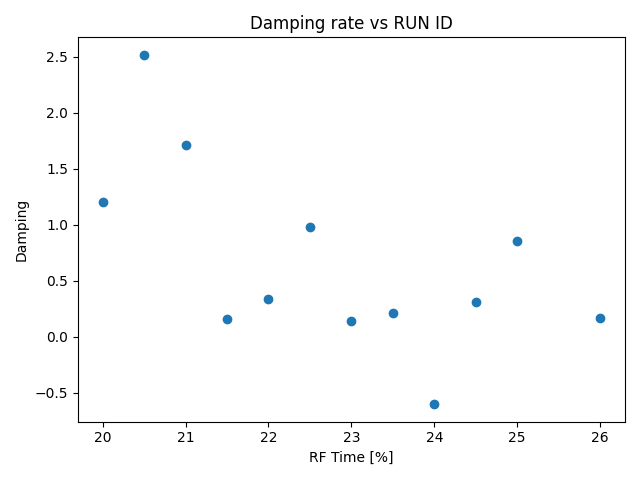

In [102]:
x = [20, 20.5, 21, 21.5, 22, 22.5, 23, 23.5, 24, 24.5, 25, 26]
fig, ax = plt.subplots(1,1)
ax.set_title("Damping rate vs RUN ID")
ax.scatter(x, all_dampings)

# # Poor fits, we should ignore. 
# ax[0].scatter(154, all_dampings[0], c='r', marker='x', s=100, alpha=0.7)
# ax[0].scatter(161, all_dampings[7], c='r', marker='x', s=100, alpha=0.7)
# ax[0].scatter(164, all_dampings[10], c='r', marker='x', s=100, alpha=0.7)
# ax[0].scatter(168, all_dampings[14], c='r', marker='x', s=100, alpha=0.7)
# ax[0].scatter(170, all_dampings[16], c='r', marker='x', s=100, alpha=0.7)

# ax[0].axvline(x=160.5, ls='--', c='r', alpha=0.3)
# ax[0].axvline(x=167.5, ls='--', c='r', alpha=0.3)
# ax[1].set_title("Damping rate vs Condensation Fraction")
# ax[1].scatter(x, all_dampings[1:7], label="kick_wait_time = 750 ms")
# ax[1].scatter(x, all_dampings[8:14], label="kick_wait_time = 500 ms")
# ax[1].scatter(x, all_dampings[15:], label="kick_wait_time = 1000 ms")
# ax[1].set_ylim([-0.4, 4])
# plt.legend()
ax.set_xlabel("RF Time [%]")
ax.set_ylabel("Damping")
plt.tight_layout()
plt.show()

#### 2D Fitting

In [265]:
####################################################
####################################################
#         LOOP FOR ANALYSIS
# 
# Fit each image with either the TF profile or 
# TC profile, and extract the parameters. Then fit.
####################################################
####################################################
save = True

for shot in [234]:
    # Make directory 
    save_folder = "/home/bec_lab/Desktop/imgs/2DFits/{:}_{:}_2DFits/".format(date, shot)

    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    resvars_all = []
    odrout_all = []

    for num in [8]: #range(1):
        # Generating the data
        atoms, flat, dark, fft_atoms, fft_flat, ang1, amp = fft_analysis(date, shot, num, dz_focus, 
                                                                         quad_cut=quad_cut, multi_loop=multi_loop)
        ang_cut = ang1[cut[0]:cut[1], cut[2]:cut[3]]

        # Fitting the data
        pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout = fitting(ang_cut, 'timecrystal', normalize=True)

        # Rotating the image, for a nicer linecut
        pic = rotate(pic, (odrout.beta[2]*(180/np.pi)), mode='reflect')
        fitresult = rotate(fitresult, (odrout.beta[2]*(180/np.pi)), mode='reflect')

        # If 90 degrees off: 
        if pic.shape[0] > pic.shape[1]:
            pic = np.transpose(np.transpose(np.transpose(pic)))
            fitresult = np.transpose(np.transpose(np.transpose(fitresult)))

        # Center linecut value
        indx = np.where(fitresult == fitresult.min())
        center_line = int(indx[0])  

        # # The integrated collumns around the condensate
        tl = int(center_line + odrout.beta[-4])
        bl = int(center_line - odrout.beta[-4]) 
        intg_ang = pic[bl:tl].sum(axis=0) 

        # Plotting
        fig = plt.figure(figsize=(9, 7))
        gs = GridSpec(4, 1, wspace=0.0, hspace=0.030)
        ax1 = fig.add_subplot(gs[0])
        ax2 = fig.add_subplot(gs[1], sharex=ax1, sharey=ax1)
        ax3 = fig.add_subplot(gs[2], sharex=ax1)
        ax4 = fig.add_subplot(gs[3], sharex=ax1)
        vmin = -0
        vmax = 2

        im = ax1.imshow(pic, vmin=vmin, vmax=vmax, aspect='auto', origin='lower', cmap='afmhot', interpolation='none')
        ax1.axhline(y=center_line, alpha=0.4, ls='--')
        ax2.imshow(fitresult, vmin=vmin, vmax=vmax, aspect='auto', origin='lower', cmap='afmhot', interpolation='none')
        ax3.plot(intg_ang/(tl-bl), c='g', alpha=0.4, label="Averaged integrated around the condensate")
        ax4.plot(fitresult[center_line], c='r',ls='--', alpha=0.4, label="Linecut through the center of the fit")
        ax4.scatter(range(len(pic[center_line])), pic[center_line], c='b', alpha=0.4, s=2, label="Linecut through the center of the condensate")
        plt.colorbar(im, ax=[ax1, ax2, ax3, ax4])
        ax1.set_title("{:}-{:} num: {:} at focus {:}".format(date, shot, num, round(dz_focus, 5)))
#         ax3.set_title("Averaged integrated around the condensate")
#         ax4.set_title("Linecut through the center of the condensate, fitted")
#         ax3.legend()
#         ax4.legend()
        plt.tight_layout()
        plt.show()

        if odrout.beta[7] < odrout.beta[6]:
            # Swap if they got fitted wrongly
            odrout.beta[7], odrout.beta[6] = odrout.beta[6], odrout.beta[7]
            odrout.beta[2] = odrout.beta[2] - np.pi/2

        resvars_all.append(odrout.res_var)

        odrout_all.append(odrout.beta)
        plt.savefig(save_folder + "/num_{:}.png".format(str(num).zfill(5)))
        plt.show()
    #     plt.close()
    #     clear_output()

    if save: 
        # Save the fitted parameters
        np.save(save_folder + "{:}_{:}_odrout.npy".format(date, shot), odrout_all)


Position of peaks:  (array([45]), array([532]))
Found the peak! It is at [45, 532]
(188, 1988) (188, 1988)
[  0.   1.   0.  30. 226.   1.  10. 150.  50.   1.   0.   1.]
Performing xy swap due to angle.


<IPython.core.display.Javascript object>

<ipython-input-265-de371e3d159e>:70: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


## Phase Transition 

In [224]:
# Initialize The Date  
date = 20221212
shot = 227 # Not needed really.
num = 0
dz_focus = 0.0000
quad_cut = "quad2"
cut = [90, -5, 750, 1250]
multi_loop = 2

Similar to what we did before, let's plot this and then analyse the data and the dynamic quantities. 

##### Preprocessing 1D & 2D 

In [184]:
popt = [0,0,0,0,0,0,0,0,0]
frame_num = 20
track_motion = True
save = True
dp = True  # True if it has been done before - variable for data pre-processing

for shot in [234]: 
    # Generate empty array to append the data to 
    total_linecuts = []
    axamps_all = []
    odrout_all = []
    axamps_max = []
    
    # Make directory if it doens't exist
    save_folder = "/home/bec_lab/Desktop/imgs/1DFits/{:}_{:}_1DFitsTEMPTEMP2/".format(date, shot)
    
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)
    
    # To make it faster we can load the pre-processed file. 
    full_path = "/storage/data/{:}/{:}/".format(date, str(shot).zfill(4))
    
    if os.path.exists(full_path + "pics_foc_{:}_{:}.fits".format(quad_cut, dz_focus)):
        print("Analysis previously completed")
        allangs = pyfits.open(full_path + "pics_foc_{:}_{:}.fits".format(quad_cut, dz_focus))[0].data.astype(float)[:]
        dp = True        
        
    for num in range(19, 47): #range(50):
        print("Analyzing and plotting: SHOT: {:} -- {:}/{:}".format(shot, num+1, frame_num))
        # Generating the data
        if not dp:
            atoms, flat, dark, fft_atoms, fft_flat, ang1, amp = fft_analysis(date, shot, num, dz_focus, quad_cut=quad_cut, multi_loop=multi_loop)
        else:
            ang1 = allangs[num]
            
        ang_cut = ang1[cut[0]:cut[1], cut[2]:cut[3]]
        
        
        ##### 1D Fitting #####3
        # Get the rough center position
        indx_center = np.where(ang_cut == ang_cut.min())
        center=(indx_center[0][0], indx_center[1][0])

        # Fitting the data - with TF first
        pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout = fitting(ang_cut, 'tf', normalize=True)

        # Rotating the image
        pic = rotate(pic, (odrout.beta[2]*(180/np.pi)), mode='reflect')
        fitresult = rotate(fitresult, (odrout.beta[2]*(180/np.pi)), mode='reflect')

        
        # If 90 degrees off: 
        if pic.shape[0] > pic.shape[1]:
            pic = np.transpose(np.transpose(np.transpose(pic)))
            fitresult = np.transpose(np.transpose(np.transpose(fitresult)))

        # Center linecut value
        indx = np.where(fitresult == fitresult.min())
        center_line = indx[0][0]

        # The integrated collumns around the condensate
        if odrout.beta[7] < odrout.beta[6]:
            tfxw = odrout.beta[7]
            pic = np.flip(pic, 1)
            fitresult = np.flip(fitresult)
            # Swap if they got fitted wrongly (error with rotation most likely)
            odrout.beta[7], odrout.beta[6] = odrout.beta[6], odrout.beta[7]
            odrout.beta[2] = odrout.beta[2] - np.pi/2
        else:
            tfxw = odrout.beta[6]

        if track_motion:
            # If track motion, then each cut around an image should have a condensate centered. 
            ymid = odrout.beta[4]
            edge_l = int(ymid-150)
            edge_r = int(ymid+150)
        else: 
            # Else, we simply cut a predefined edge. 
            edge_l = 0
            edge_r = 450

        tfxw = min(odrout.beta[-2], odrout.beta[-1])
        tl = int(center_line + tfxw)
        bl = int(center_line - tfxw) 

        intg_ang = pic[bl:tl].sum(axis=0) / abs(tl-bl)
        
        # Append the minimum value of the pic -> Perhaps that one will be a better 
        # indicator for axial mode oscillation
        axamps_max.append(pic[bl:tl].min()) 
        
        # Ensure all are the same size
        intg_ang = intg_ang[edge_l:edge_r]
        total_linecuts.append(intg_ang)
        intg_ang = -np.log(intg_ang)

        
        # Fit 1D Axial mode profile to each.
#         TFAX_1D_mod1(x, amp, mid, r, axamp, j)
#         TFAX_1D(x, amp, mid, r, axamp, j, a, b)

#         try: 
        p02=[1, 153, 160, 1, 57, 0, 1] # for TFAX_1D
        p0=[1, 153, 160, 1, 57]       # for TFAX_1D_mod1
        xdata = np.linspace(0,  pic[bl-20:tl+20, edge_l:edge_r].shape[1],  pic[bl-20:tl+20, edge_l:edge_r].shape[1])
        popt, pcov = curve_fit(TFAX_1D_mod1, xdata, intg_ang, p0=p0)
        popt2, pcov2 = curve_fit(TFAX_1D, xdata, intg_ang, p0=p02)
#         except: 
#             pass
        
        # Save fitting output to be plotted later. 
        odrout_all.append(odrout.beta)
        axamps_all.append(popt[3]) # If the fit is not successful, then the result for the previous run is appended. 

        
#         ##### 2D fitting 
#         # Fitting the data
#         j_guess = 53
#         pic_2d, fitresult_2d, fitguess_2d, fitresultgauss_2d, fitresulttf_2d, fitted_vars_2d, odrout_2d = fitting(ang_cut, 'timecrystal', normalize=True)

#         # Rotating the image, for a nicer linecut
#         pic_2d = rotate(pic_2d, (odrout_2d.beta[2]*(180/np.pi)), mode='reflect')
#         fitresult_2d = rotate(fitresult_2d, (odrout_2d.beta[2]*(180/np.pi)), mode='reflect')

#         # If 90 degrees off: 
#         if pic_2d.shape[0] > pic_2d.shape[1]:
#             pic_2d = np.transpose(np.transpose(np.transpose(pic_2d)))
#             fitresult_2d = np.transpose(np.transpose(np.transpose(fitresult_2d)))

#         # Center linecut value
#         indx_2d = np.where(fitresult_2d == fitresult_2d.min())
#         center_line_2d = int(indx_2d[0])  
#         intg_ang_2d = fitresult_2d[bl:tl].sum(axis=0) / abs(tl-bl)
  
#         # Ensure all are the same size
#         intg_ang_2d = intg_ang_2d[edge_l:edge_r]
#         intg_ang_2d = -np.log(intg_ang_2d)
#         minx = -len(intg_ang_2d)/2*2.47148288973384
#         maxx = len(intg_ang_2d)/2*2.47148288973384
        
#         xdata_intg = np.linspace(minx, maxx, len(intg_ang_2d))
    
        # Plotting
        vmin = -0
        vmax = 2
        fig, ax = plt.subplots(1, 1, figsize=(8, 4))
        ax.imshow(pic[bl-20:tl+20, edge_l:edge_r], vmin=vmin, vmax=vmax, 
                     aspect='auto', origin='lower', cmap='afmhot', interpolation='none')
        
        ax.axhline(y=20, ls='--', alpha=0.4)
        ax.axhline(y=20+tl-bl, ls='--', alpha=0.4)
#         ax[1].imshow(fitresult_2d[bl-20:tl+20, edge_l:edge_r], vmin=vmin, vmax=vmax, 
#                      aspect='auto', origin='lower', cmap='afmhot', interpolation='none')        
#         ax[2].scatter(xdata_intg, intg_ang, c='k', alpha=0.5, s=4)
# #         ax[2].plot(TFAX_1D_mod1(xdata, *popt), ls='-', c='r', alpha=0.6, linewidth=2)
#         ax[2].plot(xdata_intg, intg_ang_2d, ls='-', c='r', alpha=0.6, linewidth=2)
# #         ax[2].plot(TFAX_1D(xdata, *popt2), ls='--', c='g', alpha=0.6)
# #         fig.suptitle("{:} - {:} - {:} ".format(date, shot, num))

#         ax[0].set_xticks([])
#         ax[0].set_yticks([])
#         ax[1].set_xticks([])
#         ax[1].set_yticks([])
#         ax[2].set_yticks([0, 1], fontsize=15)
#         ax[2].set_xlabel("z [$\mu m$]", fontsize=15)
#         ax[2].set_ylabel("Density [a.u.]", fontsize=15)
#         plt.tight_layout()
        
        if save:
            plt.savefig(save_folder + "/num_{:}.png".format(str(num).zfill(5)))
            plt.close()
            clear_output()
        else:
            plt.show()   
            
    if save: 
        # Save the fitted parameters
        np.save(save_folder + "{:}_{:}_odrout.npy".format(date, shot), odrout_all)
        np.save(save_folder + "{:}_{:}_axamps_all.npy".format(date, shot), axamps_all)        
        np.save(save_folder + "{:}_{:}_axamps_max.npy".format(date, shot), axamps_max)

##### PRE-PROCESSING


In [223]:
popt = [0,0,0,0,0,0,0,0,0]
frame_num = 20
track_motion = True
save = False
dp = True  # True if it has been done before - variable for data pre-processing

for shot in [94]: 
    # Generate empty array to append the data to 
    total_linecuts = []
    axamps_all = []
    odrout_all = []
    axamps_max = []
    
    # Make directory if it doens't exist
    save_folder = "/home/bec_lab/Desktop/imgs/1DFits/{:}_{:}_1DFits/".format(date, shot)
    
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)
    
    # To make it faster we can load the pre-processed file. 
    full_path = "/storage/data/{:}/{:}/".format(date, str(shot).zfill(4))
    
    if os.path.exists(full_path + "pics_foc_{:}_{:}.fits".format(quad_cut, dz_focus)):
        print("Analysis previously completed")
        allangs = pyfits.open(full_path + "pics_foc_{:}_{:}.fits".format(quad_cut, dz_focus))[0].data.astype(float)[:]
        dp = True        
        
    for num in range(50):
        print("Analyzing and plotting: SHOT: {:} -- {:}/{:}".format(shot, num+1, frame_num))
        # Generating the data
        if not dp:
            atoms, flat, dark, fft_atoms, fft_flat, ang1, amp = fft_analysis(date, shot, num, dz_focus, quad_cut=quad_cut, multi_loop=multi_loop)
        else:
            ang1 = allangs[num]
            
        ang_cut = ang1[cut[0]:cut[1], cut[2]:cut[3]]

        # Get the rough center position
        indx_center = np.where(ang_cut == ang_cut.min())
        center=(indx_center[0][0], indx_center[1][0])

        # Fitting the data - with TF first
        pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout = fitting(ang_cut, 'tf', normalize=True)

        # Rotating the image
        pic = rotate(pic, (odrout.beta[2]*(180/np.pi)), mode='reflect')
        fitresult = rotate(fitresult, (odrout.beta[2]*(180/np.pi)), mode='reflect')

        
        # If 90 degrees off: 
        if pic.shape[0] > pic.shape[1]:
            pic = np.transpose(np.transpose(np.transpose(pic)))
            fitresult = np.transpose(np.transpose(np.transpose(fitresult)))

        # Center linecut value
        indx = np.where(fitresult == fitresult.min())
        center_line = indx[0][0]

        # The integrated collumns around the condensate
        if odrout.beta[7] < odrout.beta[6]:
            tfxw = odrout.beta[7]
            pic = np.flip(pic, 1)
            fitresult = np.flip(fitresult)
            # Swap if they got fitted wrongly (error with rotation most likely)
            odrout.beta[7], odrout.beta[6] = odrout.beta[6], odrout.beta[7]
            odrout.beta[2] = odrout.beta[2] - np.pi/2
        else:
            tfxw = odrout.beta[6]

        if track_motion:
            # If track motion, then each cut around an image should have a condensate centered. 
            ymid = odrout.beta[4]
            edge_l = int(ymid-150)
            edge_r = int(ymid+150)
        else: 
            # Else, we simply cut a predefined edge. 
            edge_l = 0
            edge_r = 450

        tfxw = min(odrout.beta[-2], odrout.beta[-1])
        tl = int(center_line + tfxw)
        bl = int(center_line - tfxw) 

        intg_ang = pic[bl:tl].sum(axis=0) / abs(tl-bl)
        
        # Append the minimum value of the pic -> Perhaps that one will be a better 
        # indicator for axial mode oscillation
        axamps_max.append(pic[bl:tl].min()) 
        
        # Ensure all are the same size
        intg_ang = intg_ang[edge_l:edge_r]
        total_linecuts.append(intg_ang)
        intg_ang = -np.log(intg_ang)

        
        # Fit 1D Axial mode profile to each.
#         TFAX_1D_mod1(x, amp, mid, r, axamp, j)
#         TFAX_1D(x, amp, mid, r, axamp, j, a, b)

#         try: 
        p0=[1, 153, 160, 1, 53, 0, 1] # for TFAX_1D
        p0=[1, 153, 160, 1, 57]       # for TFAX_1D_mod1
        xdata = np.linspace(0,  pic[bl-20:tl+20, edge_l:edge_r].shape[1],  pic[bl-20:tl+20, edge_l:edge_r].shape[1])
        popt, pcov = curve_fit(TFAX_1D_mod1, xdata, intg_ang, p0=p0)
#         except: 
#             pass
        
        # Save fitting output to be plotted later. 
        odrout_all.append(odrout.beta)
        axamps_all.append(popt[3]) # If the fit is not successful, then the result for the previous run is appended. 
        
        
        # Plotting
        vmin = -0
        vmax = 2
        fig, ax = plt.subplots(2, 1, figsize=(8, 8))
        try:
            ax[0].imshow(pic[bl-20:tl+20, edge_l:edge_r], vmin=vmin, vmax=vmax, aspect='auto', origin='lower', cmap='afmhot', interpolation='none')
            ax[0].axhline(y=20, ls='--', alpha=0.4)
            ax[0].axhline(y=20+tl-bl, ls='--', alpha=0.4)
            ax[1].scatter(xdata, intg_ang, c='k', alpha=0.5, s=4)
            ax[1].plot(TFAX_1D_mod1(xdata, *popt), ls='-', c='r', alpha=0.95, linewidth=3)
#             ax[1].plot(TFAX_1D(xdata, *p0), ls='--', c='b', alpha=0.8)
            fig.suptitle("{:} - {:} - {:} ".format(date, shot, num))
        except:
            fig.suptitle("{:} - {:} - {:} COULDNT FIT ".format(date, shot, num))

        if save:
            plt.savefig(save_folder + "/num_{:}.png".format(str(num).zfill(5)))
            plt.close()
            clear_output()
        else:
            plt.show()   
            
    if save: 
        # Save the fitted parameters
        np.save(save_folder + "{:}_{:}_odrout.npy".format(date, shot), odrout_all)
        np.save(save_folder + "{:}_{:}_axamps_all.npy".format(date, shot), axamps_all)        
        np.save(save_folder + "{:}_{:}_axamps_max.npy".format(date, shot), axamps_max)

Analysis previously completed
Analyzing and plotting: SHOT: 94 -- 1/20


ValueError: zero-size array to reduction operation minimum which has no identity

#### Dynamics - FULL PLOTS

In [221]:
# Chose a shot number to check
for shot in [94]: #range(234, 240):
    # Load data from saved files - this way, we can avoid doing the entire processing thing. 
    file_folder = "/home/bec_lab/Desktop/imgs/1DFits/{:}_{:}_1DFits/".format(date, shot)
    odrout_all = np.load(file_folder + "{:}_{:}_odrout.npy".format(date, shot))
    axamps_all = np.load(file_folder + "{:}_{:}_axamps_all.npy".format(date, shot))
    axamps_max = np.load(file_folder + "{:}_{:}_axamps_max.npy".format(date, shot))


    n_of_nums = len(odrout_all) # number of images per shot
    t_delta = 0.002 # 2 ms between the shots
    shift = 0.315 # Time shift between the two imaging loops
    print(n_of_nums)

    # Temp
#     time = np.linspace(0, n_of_nums*t_delta, n_of_nums)
#     time_d = np.linspace(0, n_of_nums*t_delta, 10000) # for fits we want more data points for a smoother curve

    time = []
    time.append(np.linspace(0, (n_of_nums//2)*t_delta, n_of_nums//2))
    time.append(np.linspace((n_of_nums//2)*t_delta + shift, (n_of_nums)*t_delta + shift, n_of_nums//2))
    time_d = np.linspace(0, n_of_nums*t_delta + shift, 10000) # for fits we want more data points for a smoother curve
    time = np.concatenate(time)
    
    p0s = [[0.025, 95, 0, 0, 0, 0],     # Angle
           [10, 95, 0, 95, 0, 1],       # X-middle
           [10, 4, 3, 225, 0, 1],       # Y-middle
           [0.25, 190, 0, 1.25, 0, 1],  # TF-amplitude
           [10, 190, 0, 95, 0, 1],      # Radial Width 
           [2, 4, 0, 5, 0, 1],          # Axial Width
           [0.25, 95, 0.45, 0, -1, 0],      # Axial Amplitude
           [0.25, 95, 0.45, 0, -1, -1]]      # Axial Amplitude, second part
    #      [amp, freq, phase, offset, damping, slope]

    # Generate data from the odrout_all list
    data = []
    for i in range(2,8):
        data.append([d[i] for d in odrout_all])
    data.append(axamps_all)
    data.append(axamps_max)
    
    par_names = ['Angle', 'X-Center', 'Y-Center', 'TF Amplitude', 'Radial width', 'Axial width', "Ax. Amp", "Max Amplitude Point"]

    # Create a figure
    fig, ax = plt.subplots(7, 1, figsize=(9, 9), sharex=True)
#     outputstr = " {:<13} | {:<12} | {:<12} | {:<12} | {:<12} | {:<12} | {:<12} |".format(" ", "amp", 'freq', 'phase', 'offset', 'damping', 'slope')
    plt.suptitle("{:} - {:}".format(date, str(shot).zfill(4)), fontweight="bold")
#     plt.tight_layout()
#     print(outputstr)

    for i in range(7):
        ax[i].scatter(time, data[i], s=6, c='k')
        ax[i].set_title("{:<12}".format(par_names[i]), fontsize=10)

#     ax[7].scatter(time, axamps_max, s=2)
#     ax[7].set_title("{:<12}".format("Max Amplitude Point"), fontsize=10)
#     plt.tight_layout()

    
    # Fitting and plotting the fits
    for i in range(7):
        data_cutoff = -1  # -1 if all
        try: 
            popt, pcov = curve_fit(func_damp_lin, time[:data_cutoff], data[i][:data_cutoff], p0=p0s[i], maxfev=5000)
            resvar = np.mean((data[i][:data_cutoff] - func_damp_lin(time[:data_cutoff], *popt))**2)
            ax[i].plot(time_d, func_damp_lin(time_d, *popt), c='r', alpha=0.3, label="{:} Hz".format(round(popt[1], 1)))
            ax[i].set_title("{:<12} | {:>12} | {:>12}".format(par_names[i], "f = {:} Hz".format(round(popt[1], 1)), "Damping = {:}".format(round(popt[4], 3))), fontsize=10)
        except:
            ax[i].set_title("{:<12} | {:>12}".format(par_names[i], " -- No Fit --"), fontsize=10)

#         perr = np.sqrt(np.diag(pcov))
#         form_vals = []
#         for j in range(6):
#             form_vals.append(str_with_err(popt[j], perr[j]))
#         fitvarsextracted = "| {:<12} | {:<12} | {:<12} | {:<12} | {:<12} | {:<12} | {:<12} |".format(par_names[i].upper(), *form_vals)
#         print(fitvarsextracted)
#         outputstr += "\n" + fitvarsextracted


#     for i in [6]:
# #         try: 
#         popt, pcov = curve_fit(func_damp_lin, time[25:], data[i][25:], p0=p0s[i], maxfev=10000)
#         ax[i].plot(time_d[7500:], func_damp_lin(time_d, *popt)[7500:], c='b', alpha=0.3, label="{:} Hz".format(round(popt[1], 1)))
#         ax[i].set_title("{:<12} | {:>12} | {:>12}".format(par_names[i], "f = {:} Hz".format(round(popt[1], 1)), "Damping = {:}".format(round(popt[4], 3))), fontsize=10)
# #         except:
#             ax[i].set_title("{:<12} | {:>12}".format(par_names[i], " -- No Fit --"), fontsize=10)
   


#     for a in ax:
#         a.set_xlim(0.25, 0.5)
#         if a != ax[-1]:
#             a.set_xticks([])
    ax[6].set_xlabel("Time [s]")
#     if True: #Change to True when you want to save. 
#         save_folder_dynamical = "/home/bec_lab/Desktop/imgs/dynamical_properties_fits/"
#         if not os.path.exists(save_folder_dynamical):
#             os.makedirs(save_folder_dynamical)  
#         plt.savefig(save_folder_dynamical + "{:}_{:}".format(date, str(shot).zfill(4)))
# #         with open(save_folder_dynamical + '{:}_{:}_fittedparams.txt'.format(date, str(shot).zfill(4)), 'w') as f:
#             f.write(outputstr)
    plt.tight_layout()
    plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '/home/bec_lab/Desktop/imgs/1DFits/20230113_94_1DFits/20230113_94_odrout.npy'

#### Dynamics - ZOOMED PLOTS

<IPython.core.display.Javascript object>


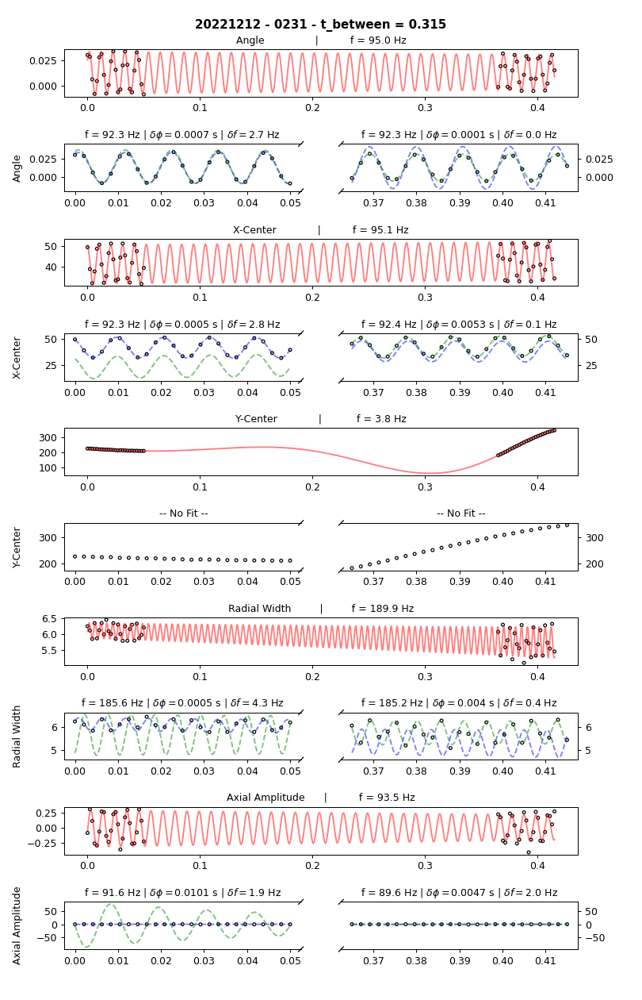

In [533]:
### Pretty Plots
# Only angle, breathing mode and axial mode
allaxial = []
allrad = []
allang = []

for shot in [231]: # , 234, 235, 236]: #range(234, 240):
    # Load data from saved files - this way, we can avoid doing the entire processing thing. 
    file_folder = "/home/bec_lab/Desktop/imgs/1DFits/{:}_{:}_1DFits/".format(date, shot)
    odrout_all = np.load(file_folder + "{:}_{:}_odrout.npy".format(date, shot))
    axamps_all = np.load(file_folder + "{:}_{:}_axamps_all.npy".format(date, shot))
    axamps_max = np.load(file_folder + "{:}_{:}_axamps_max.npy".format(date, shot))

    n_of_nums = len(odrout_all) # number of images per shot
    t_delta = 0.002 # 2 ms between the shots
    shift = 0.315 # Time shift between the two imaging loops
#         shift = 0.310 + sh*0.0001 # Time shift between the two imaging loops
    alpha = 0.5

    # Construct the time axis 
    time = []
    time1 = np.linspace(0, (n_of_nums//2)*t_delta, n_of_nums//2)
    time2 = np.linspace((n_of_nums//2)*t_delta + shift, (n_of_nums)*t_delta + shift, n_of_nums//2)
    time_d1 = np.linspace(0, (n_of_nums//2)*t_delta, 10000) # for fits we want more data points for a smoother curve
    time_d2 = np.linspace((n_of_nums//2)*t_delta + shift, (n_of_nums)*t_delta + shift, 10000) 
    time_dtotal = np.linspace(0, n_of_nums*t_delta + shift, 10000) # for fits we want more data points for a smoother curve

    time_total = []
    time_total.append(np.linspace(0, (n_of_nums//2)*t_delta, n_of_nums//2))
    time_total.append(np.linspace((n_of_nums//2)*t_delta + shift, (n_of_nums)*t_delta + shift, n_of_nums//2))
    time_total = np.concatenate(time_total)


    # Initial Guesses 
    p0s = [[0.025, 95, 0, 0, 0, 0],     # Angle
           [10, 95, 0, 95, 0, 1],       # X-middle
           [12, 4, 0.01, 225, 0, 1],       # Y-middle
           [10, 190, 0, 95, 0, 1],      # Radial Width 
           [0.25, 95, 0.45, 0, -1, 0],  # Axial Amplitude
           [0.25, 95, 0.45, 0, -1, 0]]  # Axial Amplitude
    #      [amp, freq, phase, offset, damping, slope]

    # Generate data from the odrout_all list
    data = []
    for i in [2, 3, 4, 6]:
        data.append([d[i] for d in odrout_all])
    data.append(axamps_all)
#         data.append(axamps_all)
    par_names = ['Angle', 'X-Center', 'Y-Center', 'Radial Width', 'Axial Amplitude']


    # PLOTTING 
    # Create a figure
    fig = plt.figure(figsize=(9, 14))
    gs = GridSpec(10, 2, figure=fig)

    plt.suptitle("{:} - {:} - t_between = {:}".format(date, str(shot).zfill(4), shift), fontweight="bold")
    plt.subplots_adjust(left=0.1,
                        bottom=0.05,
                        right=0.9,
                        top=0.95,
                        wspace=0.17,
                        hspace=1.)


    for i in range(5):
        # Full Fits
        ax0 = fig.add_subplot(gs[2*i, :])
        ax0.scatter(time_total, data[i], s=9, marker='o', facecolors='none', edgecolors='k')
        try: 
            popt, pcov = curve_fit(func_damp_lin, time_total, data[i], p0=p0s[i], maxfev=5000)
            ax0.plot(time_dtotal, func_damp_lin(time_dtotal, *popt), c='r', alpha=alpha, label="{:} Hz".format(round(popt[1], 1)))
            ax0.set_title("{:<20} | {:>20}".format(par_names[i], "f = {:} Hz".format(round(popt[1], 1))), fontsize=10)
        except:
            ax0.set_title("{:<12} NOFIT".format(par_names[i]), fontsize=10)

        # Two small insets
        ax0 = fig.add_subplot(gs[2*i+1, 0])
        ax1 = fig.add_subplot(gs[2*i+1, 1], sharey=ax0)
        ax0.scatter(time1, data[i][:(n_of_nums//2)], s=9, facecolors='none', edgecolors='k')
        ax1.scatter(time2, data[i][(n_of_nums//2):], s=9, facecolors='none', edgecolors='k')
        ax0.set_title("{:<12}".format(par_names[i]), fontsize=10)
        ax0.set_ylabel(par_names[i])

        # Modify the spines and draw the diagonal lines 
        ax0.spines['right'].set_visible(False)
        ax1.spines['left'].set_visible(False)
        ax0.yaxis.tick_left()
        ax1.tick_params(labelright='off')
        ax1.yaxis.tick_right()
        d = .010 # how big to make the diagonal lines in axes coordinates
        kwargs = dict(transform=ax0.transAxes, color='k', linewidth=1, clip_on=False)
        ax0.plot((1-d,1+d), (-5*d,+5*d), **kwargs)
        ax0.plot((1-d,1+d),(1-5*d,1+5*d), **kwargs)
        kwargs.update(transform=ax1.transAxes)  # switch to the bottom axes
        ax1.plot((-d,+d), (1-5*d,1+5*d), **kwargs)
        ax1.plot((-d,+d), (-5*d,+5*d), **kwargs)

        # Full fit for the subplots
        data_cutoff = -1  
        try: 
            popt, pcov = curve_fit(func_damp_lin, time_total[:data_cutoff], data[i][:data_cutoff], p0=p0s[i], maxfev=10000)
            resvar = np.mean((data[i][:data_cutoff] - func_damp_lin(time_total[:data_cutoff], *popt))**2)
#             ax0.plot(time_d1, func_damp_lin(time_d1, *popt), c='r', ls='--', alpha=alpha, label="{:} Hz".format(round(popt[1], 1)))
#             ax1.plot(time_d2, func_damp_lin(time_d2, *popt), c='r', ls='--', alpha=alpha, label="{:} Hz".format(round(popt[1], 1)))
#             ax0.set_title("{:<12} | {:>12}".format("f = {:} Hz".format(round(popt[1], 1)), "Damping = {:}".format(round(popt[4], 3))), fontsize=10)
            phase_full = popt[2]
            freq_full = popt[1]
            if i == 0: 
                allang.append(["SHIFT", shift, par_names[i], resvar])
            if i == 3: 
                allrad.append(["SHIFT", shift, par_names[i], resvar])
            if i == 4: 
                allaxial.append(["SHIFT", shift, par_names[i], resvar])
#                 if i in [4, 5]:
#                     ax0.set_facecolor("#e1ddbf")
#                     ax1.set_facecolor("#e1ddbf")
        except:
            ax0.set_title("{:<12} NOFIT".format(par_names[i]), fontsize=10)
            ax1.set_title("{:<12}".format(" -- No Fit --", fontsize=10))


        # first part only 
        try: 
            popt, pcov = curve_fit(func_damp_lin, time1, data[i][:(n_of_nums//2)], p0=p0s[i], maxfev=10000)
            ax0.plot(time_d1, func_damp_lin(time_d1, *popt), c='b', ls='--', alpha=alpha, label="{:} Hz".format(round(popt[1], 1)))
            ax1.plot(time_d2, func_damp_lin(time_d2, *popt), c='b', ls='--', alpha=alpha, label="{:} Hz".format(round(popt[1], 1)))
            phase_p1 = popt[2]
            freq_p1 = popt[1]
            delta_phase = (abs(phase_p1 - phase_full) % (1/(popt[1]))) 
            delta_freq = abs(freq_p1 - freq_full)
            ax0.set_title("f = {:} Hz | $\delta \phi = {:}$ s | $\delta f = {:}$ Hz".format(round(popt[1], 1), round(delta_phase, 4), round(delta_freq, 1)), fontsize=10)
        except:
            ax0.set_title("{:>12}".format(" -- No Fit --"), fontsize=10)
            ax1.set_title("{:>12}".format(" -- No Fit --"), fontsize=10)

        # second part only 
        try: 
            popt, pcov = curve_fit(func_damp_lin, time2, data[i][(n_of_nums//2):], p0=p0s[i], maxfev=10000)
            ax0.plot(time_d1, func_damp_lin(time_d1, *popt), c='g', ls='--', alpha=alpha, label="{:} Hz".format(round(popt[1], 1)))
            ax1.plot(time_d2, func_damp_lin(time_d2, *popt), c='g', ls='--', alpha=alpha, label="{:} Hz".format(round(popt[1], 1)))
            phase_p2 = popt[2]
            freq_p2 = popt[1]
            delta_phase = ((abs(phase_p2 - phase_p1) % (1/(popt[1]))))
            delta_freq = abs(freq_p2 - freq_p1)
            ax1.set_title("f = {:} Hz | $\delta \phi = {:}$ s | $\delta f = {:}$ Hz".format(round(popt[1], 1), round(delta_phase, 4), round(delta_freq, 1)), fontsize=10)
        except:
            ax1.set_title("{:>12}".format(" -- No Fit --"), fontsize=10)
            

        # Big Axial Mode Plot
#         data_cutoff = -1
#         ax0 = fig.add_subplot(gs[7, :])
#         ax0.scatter(time_total, data[4], s=9, marker='o', facecolors='none', edgecolors='k')
#         popt, pcov = curve_fit(func_damp_lin, time_total[:data_cutoff], data[4][:data_cutoff], p0=p0s[4], maxfev=5000)
#         ax0.plot(time_dtotal, func_damp_lin(time_dtotal, *popt), c='r', alpha=alpha, label="{:} Hz".format(round(popt[1], 1)))
#         ax0.set_title("{:<20} {:^20} {:>20}".format(par_names[4], "| Full Fit |", "f = {:} Hz".format(round(popt[1], 1))), fontsize=10)
#         ax0.set_xlabel("Time [s]")
        
        fig.align_ylabels()

        if True: #Change to True when you want to save. 
            save_folder_dynamical = "/home/bec_lab/Desktop/imgs/dynamical_properties_fits/tempfolder/"
            if not os.path.exists(save_folder_dynamical):
                os.makedirs(save_folder_dynamical)  
            plt.savefig(save_folder_dynamical + "NICEIMG_{:}_{:}".format(date, str(shot).zfill(4)))

        plt.show()

<IPython.core.display.Javascript object>


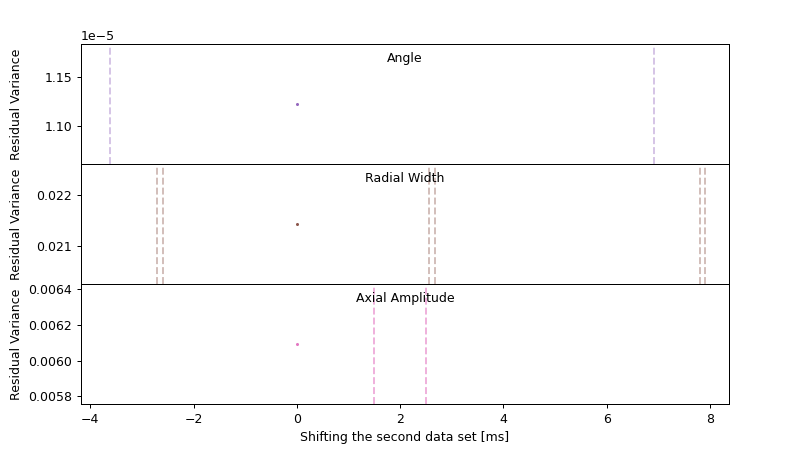

In [534]:
x = [(x[1]-0.315)*1000 for x in allaxial]
y1 = [x[3] for x in allaxial]
y2 = [x[3] for x in allrad]
y3 = [x[3] for x in allang]

indx = np.where(y3 == min(y3))[0][0]


fig, ax = plt.subplots(3,1, figsize=(9,5), sharex=True)
plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.17,
                    hspace=0.00)
ax[0].scatter(x, y3, c='C4', s=2)
ax[1].scatter(x, y2, c='C5', s=2)
ax[2].scatter(x, y1, c='C6', s=2)
ax[0].set_title("Angle", y=1.0, pad=-14, fontsize=10)
ax[1].set_title("Radial Width", y=1.0, pad=-14, fontsize=10)
ax[2].set_title("Axial Amplitude", y=1.0, pad=-14, fontsize=10)
ax[2].set_xlabel("Shifting the second data set [ms]")

# ax[0].set_xticks([])
# ax[1].set_xticks([])

for a in ax:
#     a.axvline(x=0, ls='--', c='k', alpha=0.4)
#     a.axvline(x=x[indx], ls='--', c='r', alpha=0.4, label="Smallest Res Var")
    a.set_ylabel("Residual Variance")

for i in [-3.61, 6.92]:
    ax[0].axvline(x=i, ls='--', c='C4', alpha=0.4)

for i in [-2.7, -2.6, 2.56, 2.67, 7.8, 7.9,]:
    ax[1].axvline(x=i, ls='--', c='C5', alpha=0.4)

for i in [1.5, 2.5]:
    ax[2].axvline(x=i, ls='--', c='C6', alpha=0.6)
    
fig.align_ylabels()
plt.show()



#### Just the breathing mode and the axial mode 

<IPython.core.display.Javascript object>


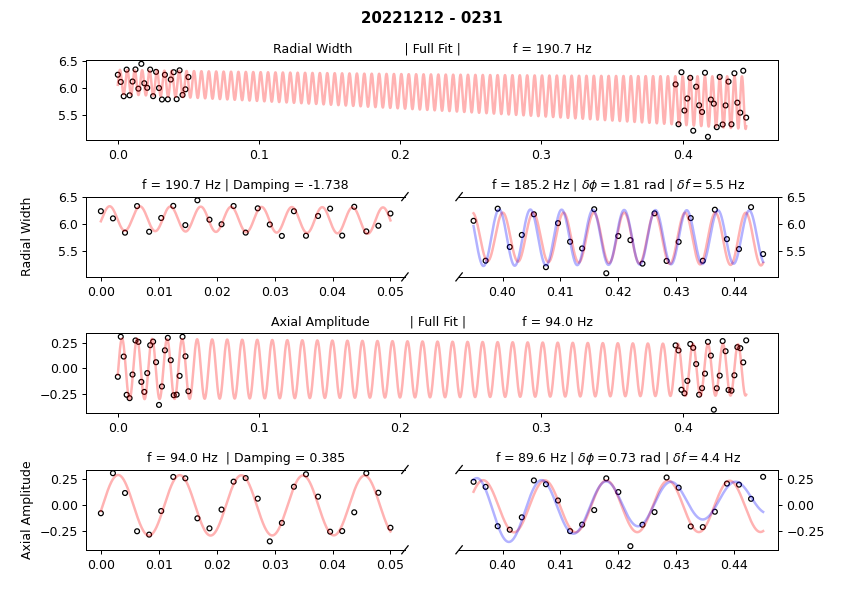

In [228]:
### Just the problematic ones. 
# Only angle, breathing mode and axial mode
save = False 
for shot in [231]: #range(234, 240):
    # Load data from saved files - this way, we can avoid doing the entire processing thing. 
    file_folder = "/home/bec_lab/Desktop/imgs/1DFits/{:}_{:}_1DFits/".format(date, shot)
    odrout_all = np.load(file_folder + "{:}_{:}_odrout.npy".format(date, shot))
    axamps_all = np.load(file_folder + "{:}_{:}_axamps_all.npy".format(date, shot))
    axamps_max = np.load(file_folder + "{:}_{:}_axamps_max.npy".format(date, shot))

    n_of_nums = len(odrout_all) # number of images per shot
    t_delta = 0.002 # 2 ms between the shots
    shift = 0.345 # Time shift between the two imaging loops

    # Construct the time axis 
    time = []
    time1 = np.linspace(0, (n_of_nums//2)*t_delta, n_of_nums//2)
    time2 = np.linspace((n_of_nums//2)*t_delta + shift, (n_of_nums)*t_delta + shift, n_of_nums//2)
    time_d1 = np.linspace(0, (n_of_nums//2)*t_delta, 10000) # for fits we want more data points for a smoother curve
    time_d2 = np.linspace((n_of_nums//2)*t_delta + shift, (n_of_nums)*t_delta + shift, 10000) 
    time_dtotal = np.linspace(0, n_of_nums*t_delta + shift, 10000) # for fits we want more data points for a smoother curve
    
    time_total = []
    time_total.append(np.linspace(0, (n_of_nums//2)*t_delta, n_of_nums//2))
    time_total.append(np.linspace((n_of_nums//2)*t_delta + shift, (n_of_nums)*t_delta + shift, n_of_nums//2))
    time_total = np.concatenate(time_total)
    
    
    # Initial Guesses 
    p0s = [[10, 190, 0, 95, 0, 1],      # Radial Width 
           [0.25, 95, 0.45, 0, -1, 0]]  # Axial Amplitude
    #      [amp, freq, phase, offset, damping, slope]

    # Generate data from the odrout_all list
    data = []
    data.append([d[6] for d in odrout_all])
    data.append(axamps_all)
    par_names = ['Radial Width', 'Axial Amplitude']

    
    # PLOTTING 
    # Create a figure
    fig = plt.figure(figsize=(9, 6))
    gs = GridSpec(4, 2, figure=fig)
    
    plt.suptitle("{:} - {:}".format(date, str(shot).zfill(4)), fontweight="bold")
    plt.subplots_adjust(left=0.1,
                        bottom=0.1,
                        right=0.9,
                        top=0.9,
                        wspace=0.17,
                        hspace=0.7)

    ax0 = fig.add_subplot(gs[0, :])
    ax0.scatter(time_total, data[0], s=15, marker='o', facecolors='none', edgecolors='k')
    popt, pcov = curve_fit(func_damp_lin, time_total[:data_cutoff], data[0][:data_cutoff], p0=p0s[0], maxfev=5000)
    ax0.plot(time_dtotal, func_damp_lin(time_dtotal, *popt), linewidth=2, c='r', alpha=0.3, label="{:} Hz".format(round(popt[1], 1)))
    ax0.set_title("{:<20} {:^20} {:>20}".format(par_names[0], "| Full Fit |", "f = {:} Hz".format(round(popt[1], 1))), fontsize=10)
       
    
    ax3 = fig.add_subplot(gs[2, :])
    ax3.scatter(time_total, data[1], s=15, marker='o', facecolors='none', edgecolors='k')
    popt, pcov = curve_fit(func_damp_lin, time_total[:data_cutoff], data[1][:data_cutoff], p0=p0s[1], maxfev=5000)
    ax3.plot(time_dtotal, func_damp_lin(time_dtotal, *popt), linewidth=2, c='r', alpha=0.3, label="{:} Hz".format(round(popt[1], 1)))
    ax3.set_title("{:<20} {:^20} {:>20}".format(par_names[1], "| Full Fit |", "f = {:} Hz".format(round(popt[1], 1))), fontsize=10)
       
    popt1stpart = []
    popt2ndpart = []
    
    for i in range(2):
        ax0 = fig.add_subplot(gs[2*i+1, 0])
        ax1 = fig.add_subplot(gs[2*i+1, 1], sharey=ax0)
        
        ax0.scatter(time1, data[i][:25], s=15, facecolors='none', edgecolors='k')
        ax1.scatter(time2, data[i][25:], s=15, facecolors='none', edgecolors='k')
        ax0.set_title("{:<12}".format(par_names[i]), fontsize=10)
        ax0.set_ylabel(par_names[i])
        
        ax0.spines['right'].set_visible(False)
        ax1.spines['left'].set_visible(False)
        ax0.yaxis.tick_left()
        ax1.tick_params(labelright='off')
        ax1.yaxis.tick_right()
        d = .010 # how big to make the diagonal lines in axes coordinates
        kwargs = dict(transform=ax0.transAxes, color='k', linewidth=1, clip_on=False)
        ax0.plot((1-d,1+d), (-5*d,+5*d), **kwargs)
        ax0.plot((1-d,1+d),(1-5*d,1+5*d), **kwargs)
        kwargs.update(transform=ax1.transAxes)  # switch to the bottom axes
        ax1.plot((-d,+d), (1-5*d,1+5*d), **kwargs)
        ax1.plot((-d,+d), (-5*d,+5*d), **kwargs)

        if i == 7:
            data_cutoff = 26
        else: 
            data_cutoff = -1
            
        try: 
            popt, pcov = curve_fit(func_damp_lin, time_total[:data_cutoff], data[i][:data_cutoff], p0=p0s[i], maxfev=5000)
            popt1stpart.append(popt)
            ax0.plot(time_d1, func_damp_lin(time_d1, *popt), c='r', alpha=0.3, label="{:} Hz".format(round(popt[1], 1)), linewidth=2)
            ax1.plot(time_d2, func_damp_lin(time_d2, *popt), c='r', alpha=0.3, label="{:} Hz".format(round(popt[1], 1)), linewidth=2)
            ax0.set_title("{:<12} | {:>12}".format("f = {:} Hz".format(round(popt[1], 1)), "Damping = {:}".format(round(popt[4], 3))), fontsize=10)
            phase_initial = popt[2]
            freq_initial = popt[1]
        except:
            ax0.set_title("{:<12}".format(par_names[i]), fontsize=10)
            ax1.set_title("{:<12}".format(" -- No Fit --", fontsize=10))
            
#             try: 
        popt, pcov = curve_fit(func_damp_lin, time2, data[i][25:], p0=p0s[i], maxfev=10000)
        popt2ndpart.append(popt)
        ax1.plot(time_d2, func_damp_lin(time_d2, *popt), c='b', alpha=0.3, linewidth=2, label="{:} Hz".format(round(popt[1], 1)))
        phase_final = popt[2]
        freq_final = popt[1]
        delta_phase = (abs(phase_final - phase_initial) / (1/(popt[1])) ) % np.pi
        delta_freq = abs(freq_final - freq_initial) 
        ax1.set_title("f = {:} Hz | $\delta \phi = {:}$ rad | $\delta f = {:}$ Hz".format(round(popt[1], 1), round(delta_phase, 2), round(delta_freq, 1)), fontsize=10)
#             except:
#                 ax1.set_title("{:>12}".format(" -- No Fit --"), fontsize=10)
   
    
    fig.align_ylabels()
    
    if True: #Change to True when you want to save. 
        save_folder_dynamical = "/home/bec_lab/Desktop/imgs/dynamical_properties_fits/"
        if not os.path.exists(save_folder_dynamical):
            os.makedirs(save_folder_dynamical)  
        plt.savefig(save_folder_dynamical + "NICEIMG_{:}_{:}".format(date, str(shot).zfill(4)))
    
    plt.show()

In [548]:
popt1stpart

[array([ 2.35630002e-01,  1.89937883e+02, -1.03727450e-04,  6.10857857e+00,
        -1.83885710e+00,  9.33903315e-01]),
 array([ 2.97662789e-01,  9.34913105e+01,  4.59737105e-01, -5.67513881e-03,
         4.07283278e-01,  2.32579742e-02])]

In [546]:
popt2ndpart

[array([ 8.86386442e-01,  1.85219369e+02,  9.86757809e-03,  5.65860930e+00,
         1.42427979e+00, -2.50317290e-01]),
 array([87.67152438, 89.56792818,  0.49688736, -1.11887601, 15.27013911,
        -2.86643108])]

## Other ...